In [2]:
import numpy as np
from pymdp.agent import Agent

import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import io
import imageio
from itertools import product
import random
from IPython.display import Image, display

# reproducibility
random.seed(42551)
np.random.seed(152)

In [3]:
# BLOCK 1: Build arena mask + mappings (modular arena)
# You can change rows, cols, and corridor params below to create different arenas.

def make_two_rooms_with_corridor(rows=3, left_cols=2, corridor_cols=3, right_cols=2,
                                 corridor_rows=(1),  # tuple/list of row indices that ARE passable in corridor
                                 prefer_total_cols=None):
    """
    Construct a boolean mask for two square rooms (left, right) connected by a corridor.
    Returns mask (rows x total_cols) with True for passable cells and False for blocked.
    corridor_rows: which rows (0-indexed) in the corridor region are allowed to be passable.
                   e.g., (1,2) for two middle rows in a 4-row grid.
    prefer_total_cols: if you need a target total width (e.g. 10), you can supply it and
                       function will try to center corridor; if None, uses left+corridor+right.
    """
    # compute total_cols
    default_total = left_cols + corridor_cols + right_cols
    if prefer_total_cols is None:
        total_cols = default_total
    else:
        total_cols = prefer_total_cols
        # If prefer_total_cols differs from default, we will embed the three regions appropriately
        # We'll place left at col 0, corridor after left, and right at the end so overall fits.
    mask = np.zeros((rows, total_cols), dtype=bool)

    # left room: columns 0 .. left_cols-1 (all rows)
    left_start = 0
    left_end = left_start + left_cols  # exclusive
    mask[:, left_start:left_end] = True

    # corridor: place immediately after left
    corridor_start = left_end
    corridor_end = corridor_start + corridor_cols
    if corridor_end > total_cols:
        raise ValueError("Corridor doesn't fit in prefer_total_cols; increase total width or reduce corridor width.")
    # corridor rows: only allow rows in corridor_rows list (e.g., middle rows)
    for r in corridor_rows:
        mask[r, corridor_start:corridor_end] = True

    # right room: place at the end to make total width sensible
    right_end = total_cols
    right_start = right_end - right_cols
    mask[:, right_start:right_end] = True

    return mask, {"left": (slice(None), slice(left_start, left_end)),
                  "corridor": (slice(None), slice(corridor_start, corridor_end)),
                  "right": (slice(None), slice(right_start, right_end))}

# "T" maze with the perpendicular arm on the right
rows = 4
left_cols = 0
corridor_cols = 3   # corridor width
right_cols = 2
corridor_rows = (1,2)  # allow rows 1 and 2 (middle two rows), top(0) and bottom(3) are blocked in corridor
mask, regions = make_two_rooms_with_corridor(rows=rows, left_cols=left_cols,
                                             corridor_cols=corridor_cols, right_cols=right_cols,
                                             corridor_rows=corridor_rows, prefer_total_cols=None)

print("Arena mask shape:", mask.shape)
print("Passable cells count:", mask.sum())


Arena mask shape: (4, 5)
Passable cells count: 14


In [4]:
# BLOCK 2: Compact mapping from (r,c) -> state index and back for only passable cells


rows, cols = mask.shape
# create list of valid (r,c) and mapping arrays
valid_rc = [(r, c) for r in range(rows) for c in range(cols) if mask[r, c]]
n_states = len(valid_rc)


# observation modalities -> threat intensity/dist, shelter, agent location
n_threat_obs = 4                         # intensities 0..3 with higher intensity is closer => can make this modular in the future
n_shelter_obs = 2 # [NOT AT, AT]
n_agent_obs = n_states

actions = ["up", "down", "left", "right", "stay"]
n_actions = len(actions)

# maps: rc -> compact state id (0..n_states-1), and state->(r,c)
rc_to_state = -np.ones((rows, cols), dtype=int)   # -1 for blocked cells
state_to_rc = [None] * n_states
for i, (r, c) in enumerate(valid_rc):
    rc_to_state[r, c] = i
    state_to_rc[i] = (r, c)

def state_idx_to_rc(idx):
    return state_to_rc[int(idx)]

def rc_to_state_idx(r, c):
    return int(rc_to_state[r, c])

print("n_states (valid cells):", n_states)
print("Sample mapping: first 6 states -> rc:", state_to_rc[:6])


n_states (valid cells): 14
Sample mapping: first 6 states -> rc: [(0, 3), (0, 4), (1, 0), (1, 1), (1, 2), (1, 3)]


In [5]:
# BLOCK 3: step_from using neighbor adjacency on masked arena
# actions defined as before: 0=up,1=down,2=left,3=right,4=stay

def step_from_state(state_idx, action):
    r, c = state_idx_to_rc(state_idx)
    if action == 0:   # up
        nr, nc = r - 1, c
    elif action == 1: # down
        nr, nc = r + 1, c
    elif action == 2: # left
        nr, nc = r, c - 1
    elif action == 3: # right
        nr, nc = r, c + 1
    elif action == 4: # stay
        nr, nc = r, c
    else:
        raise ValueError("bad action")

    # If target is outside bounds or blocked, stay in place
    if nr < 0 or nr >= rows or nc < 0 or nc >= cols:
        return state_idx
    if not mask[nr, nc]:
        return state_idx
    return rc_to_state_idx(nr, nc)

# Example sanity checks
for i in range(min(6, n_states)):
    r,c = state_idx_to_rc(i)
    print("state", i, "rc", (r,c), "neighbors:", [step_from_state(i,a) for a in range(len(actions))])


state 0 rc (0, 3) neighbors: [0, 5, 0, 1, 0]
state 1 rc (0, 4) neighbors: [1, 6, 0, 1, 1]
state 2 rc (1, 0) neighbors: [2, 7, 2, 3, 2]
state 3 rc (1, 1) neighbors: [3, 8, 2, 4, 3]
state 4 rc (1, 2) neighbors: [4, 9, 3, 5, 4]
state 5 rc (1, 3) neighbors: [0, 10, 4, 6, 5]


In [6]:
# BLOCK 4: Build B (object array) using n_states and the new step_from_state function

n_agent = n_states
n_threat = n_states
n_shelter = n_states

n_controls_agent = n_actions
n_controls_threat = 1
n_controls_shelter = 1

# build B_agent: shape (S_next, S_current, n_controls_agent)
B_agent = np.zeros((n_agent, n_agent, n_controls_agent), dtype=float)

for s in range(n_agent):
    for a in range(n_actions):
        ns = step_from_state(s, a)
        # make deterministic-ish with tiny exploration noise
        B_agent[ns, s, a] += 0.99
        # distribute small noise among other reachable neighbors (including stay)
        # find reachable neighbors from s
        neighbors = set(step_from_state(s, aa) for aa in range(n_actions))
        neighbors = sorted(neighbors)
        # distribute 0.01 equally (excluding ns since we already gave 0.99)
        residue = 0.01
        for nb in neighbors:
            if nb == ns:
                continue
            B_agent[nb, s, a] += residue / max(1, (len(neighbors)-1))

# normalize columns for numerical safety
for a in range(n_controls_agent):
    col_sums = B_agent[:, :, a].sum(axis=0)
    # if some column sums slightly != 1 due to rounding, normalize
    for s in range(n_agent):
        if col_sums[s] <= 0:
            B_agent[:, s, a] = 1.0 / n_agent
        else:
            B_agent[:, s, a] /= col_sums[s]

# B for static threat and shelter (identity)
B_threat = np.zeros((n_threat, n_threat, n_controls_threat))
for s in range(n_threat):
    B_threat[s, s, 0] = 1.0

B_shelter = np.zeros((n_shelter, n_shelter, n_controls_shelter))
for s in range(n_shelter):
    B_shelter[s, s, 0] = 1.0

# pack into object array B
B = np.empty(3, dtype=object)
B[0] = B_agent
B[1] = B_threat
B[2] = B_shelter

print("Built B with shapes:")
print(" B_agent:", B_agent.shape, "n_states:", n_agent)


Built B with shapes:
 B_agent: (14, 14, 5) n_states: 14


In [7]:
# BLOCK 5: Build A modalities using compact state indices but compute manhattan in rc-space.
# This mirrors your earlier construction but iterates only over valid states.

# helper: compute manhattan distance using rc positions
def manhattan_states(s1, s2):
    r1, c1 = state_idx_to_rc(s1)
    r2, c2 = state_idx_to_rc(s2)
    return abs(r1 - r2) + abs(c1 - c2)

# observation sizes
n_threat_obs = 4
n_shelter_obs = 5
n_agent_obs = n_agent  # identity proprioception

A_threat = np.zeros((n_threat_obs, n_agent, n_threat, n_shelter))
for a in range(n_agent):
    for t in range(n_threat):
        for s in range(n_shelter):
            d = manhattan_states(a, t)
            # using same mapping as before but with more flexible arena
            if d == 0:
                A_threat[3, a, t, s] = 1.0
                # A_threat[2, a, t, s] = 0.25
            elif d == 1:
                A_threat[2, a, t, s] = 0.75
                A_threat[1, a, t, s] = 0.25
            elif d == 2:
                A_threat[1, a, t, s] = 0.75
                A_threat[0, a, t, s] = 0.25
            else:
                A_threat[0, a, t, s] = 1.0
A_threat /= A_threat.sum(axis=0, keepdims=True)

# shelter modality (is agent at shelter index?)
A_shelter = np.zeros((n_shelter_obs, n_agent, n_threat, n_shelter))
for a in range(n_agent):
    for t in range(n_threat):
        for s in range(n_shelter):
            d = manhattan_states(a, s)
            if d == 0:
                A_shelter[4, a, t, s] = 1.0
            elif d == 1:
                A_shelter[3, a, t, s] = 0.8
                A_shelter[2, a, t, s] = 0.2
            elif d == 2:
                A_shelter[2, a, t, s] = 0.95
                A_shelter[1, a, t, s] = 0.05
            elif d == 3:
                A_shelter[1, a, t, s] = 1.0
            else:
                A_shelter[0, a, t, s] = 1.0
A_shelter /= A_shelter.sum(axis=0, keepdims=True)

# agent proprioception: one-hot on compact index
A_agent = np.zeros((n_agent_obs, n_agent, n_threat, n_shelter))
for a in range(n_agent):
    A_agent[a, a, :, :] = 1.0
    # small uniform noise for others
    # A_agent[:, a, :, :] += (0.05 / (n_agent_obs - 1))
A_agent /= A_agent.sum(axis=0, keepdims=True)

# pack into object array
A = np.empty(3, dtype=object)
A[0] = A_threat
A[1] = A_shelter
A[2] = A_agent

print("Built A with shapes:", [A[i].shape for i in range(3)])


Built A with shapes: [(4, 14, 14, 14), (5, 14, 14, 14), (14, 14, 14, 14)]


In [8]:
# BLOCK 6 (REPLACEMENT): D priors — agent & threat uniform over whole arena; shelter prior = leftmost column

# helper: collect valid states in a column index
def collect_states_in_column(col_idx):
    states = []
    for r in range(rows):
        if 0 <= col_idx < cols and mask[r, col_idx]:
            states.append(rc_to_state_idx(r, col_idx))
    return sorted(states)

# find columns that contain any passable cells
cols_with_passable = np.where(mask.any(axis=0))[0]
if cols_with_passable.size == 0:
    raise RuntimeError("Arena mask has no passable cells.")

leftmost_col = int(cols_with_passable.min())
rightmost_col = int(cols_with_passable.max())

# collect states in leftmost and rightmost columns
leftcol_states = collect_states_in_column(leftmost_col)
rightcol_states = collect_states_in_column(rightmost_col)

print(f"Leftmost column index: {leftmost_col}, states count: {len(leftcol_states)}")
print(f"Rightmost column index: {rightmost_col}, states count: {len(rightcol_states)}")

# --- AGENT & THREAT PRIORS: UNIFORM OVER THE ENTIRE ARENA (clueless)
D_agent = np.ones(n_agent, dtype=float) / float(n_agent)
D_threat = np.ones(n_threat, dtype=float) / float(n_threat)

# --- SHELTER PRIOR: uniform over leftmost column
D_shelter = np.zeros(n_shelter, dtype=float)
if len(leftcol_states) > 0:
    D_shelter[leftcol_states] = 1.0 / len(leftcol_states)


# pack into object array for pymdp
D = np.empty(3, dtype=object)
D[0] = D_agent
D[1] = D_threat
D[2] = D_shelter

print("D shapes:", [D[i].shape for i in range(3)])
print("Agent prior sum:", D_agent.sum(), "Threat prior sum:", D_threat.sum(),
      "Shelter-prior mass on leftcol:", D_shelter.sum())


Leftmost column index: 0, states count: 2
Rightmost column index: 4, states count: 4
D shapes: [(14,), (14,), (14,)]
Agent prior sum: 0.9999999999999998 Threat prior sum: 0.9999999999999998 Shelter-prior mass on leftcol: 1.0


In [9]:
# BLOCK 7 (REPLACEMENT): observation sampler + renderer that support multi-cell shelter region

def sample_observations(true_agent_pos, true_threat_pos, true_shelter_pos, A):
    """
    A is object array: A[0] threat (n_threat_obs x agent x threat x shelter),
                       A[1] shelter (n_shelter_obs x agent x threat x shelter),
                       A[2] agent (n_agent_obs x agent x threat x shelter)

    true_shelter_pos may be:
      - a single integer index (compact state index) OR
      - an iterable/list/array of integer indices (multiple shelter cells).
    For multiple shelter cells we marginalize the emission over the set uniformly.
    Returns list of ints: [obs_threat_intensity, obs_shelter_presence, obs_agent_loc]
    """
    # make a list of shelter indices to marginalize over
    if isinstance(true_shelter_pos, (list, tuple, np.ndarray, set)):
        shelter_indices = sorted(list(true_shelter_pos))
        if len(shelter_indices) == 0:
            # fallback to a dummy single 0 if empty (shouldn't happen)
            shelter_indices = [0]
    else:
        shelter_indices = [int(true_shelter_pos)]

    # modality 0: threat intensity
    # if multiple shelter indices, average the emission probabilities across them (marginalize)
    p_o_threat = np.zeros(A[0].shape[0], dtype=float)
    for s_idx in shelter_indices:
        p = A[0][:, true_agent_pos, true_threat_pos, s_idx]
        p_o_threat += p
    p_o_threat /= len(shelter_indices)
    p_o_threat = p_o_threat / (np.sum(p_o_threat) + 1e-16)
    obs_threat = int(np.random.choice(len(p_o_threat), p=p_o_threat))

    # modality 1: shelter presence
    p_o_shel = np.zeros(A[1].shape[0], dtype=float)
    for s_idx in shelter_indices:
        p = A[1][:, true_agent_pos, true_threat_pos, s_idx]
        p_o_shel += p
    p_o_shel /= len(shelter_indices)
    p_o_shel = p_o_shel / (np.sum(p_o_shel) + 1e-16)
    obs_shel = int(np.random.choice(len(p_o_shel), p=p_o_shel))

    # modality 2: agent proprioception (one-hot over agent location)
    p_o_agent = np.zeros(A[2].shape[0], dtype=float)
    for s_idx in shelter_indices:
        p = A[2][:, true_agent_pos, true_threat_pos, s_idx]
        p_o_agent += p
    p_o_agent /= len(shelter_indices)
    p_o_agent = p_o_agent / (np.sum(p_o_agent) + 1e-16)
    obs_agent = int(np.random.choice(len(p_o_agent), p=p_o_agent))

    return [obs_threat, obs_shel, obs_agent]


def render_grid_frame_arena(agent_state, threat_state, shelter_state, visited_states, step,
                            threat_posterior=None, cell_size=48,
                            high_level_mode=None, current_scale=None, high_posterior=None,
                            high_step=None, upscale=3):
    """
    Render the grid with:
      - high-res internal drawing (upscale) then LANCZOS downsample for smooth shapes
      - no per-cell borders
      - shelters, threat, visited colors similar to reference
      - agent drawn as a centered circle
      - single black border around the passable arena (or full grid if no passable cells)
      - thin black divider below the top status strip
    """
    from PIL import Image, ImageDraw, ImageFont
    import numpy as np

    # normalize shelter_state
    if isinstance(shelter_state, (list, tuple, np.ndarray, set)):
        shelter_set = set(int(x) for x in shelter_state)
    else:
        shelter_set = {int(shelter_state)}

    # ensure visited is a set and include agent cell as visited
    visited = set(visited_states) if visited_states is not None else set()
    if agent_state is not None:
        try:
            visited.add(int(agent_state))
        except Exception:
            pass

    # upscale / high-res sizes
    S = max(1, int(upscale))
    cell_size_hr = int(cell_size * S)
    W_hr = cols * cell_size_hr
    H_hr = rows * cell_size_hr

    # High-res base image
    img_hr = Image.new('RGB', (W_hr, H_hr), (255, 255, 255))
    draw_hr = ImageDraw.Draw(img_hr)

    # Draw base cells (no borders)
    for r in range(rows):
        for c in range(cols):
            x0 = c * cell_size_hr
            y0 = r * cell_size_hr
            x1 = x0 + cell_size_hr - 1
            y1 = y0 + cell_size_hr - 1

            if not mask[r, c]:
                fill = (0, 0, 0)  # blocked
            else:
                idx = rc_to_state_idx(r, c)
                if (idx in visited) and (idx not in shelter_set) and idx != threat_state:
                    fill = (220, 220, 220)  # visited
                else:
                    fill = (255, 255, 255)  # free

            draw_hr.rectangle([x0, y0, x1, y1], fill=fill)

    # Heatmap overlay on separate RGBA layer (so we can composite cleanly)
    if threat_posterior is not None:
        heat_layer = Image.new('RGBA', (W_hr, H_hr), (0, 0, 0, 0))
        draw_heat = ImageDraw.Draw(heat_layer)
        heat = np.zeros((rows, cols))
        for s_idx in range(len(threat_posterior)):
            rr, cc = state_idx_to_rc(s_idx)
            heat[rr, cc] = float(threat_posterior[s_idx])
        for r in range(rows):
            for c in range(cols):
                if mask[r, c] and heat[r, c] > 0:
                    a = min(0.9, heat[r, c] * 2.5)
                    alpha = int(a * 200)
                    x0 = c * cell_size_hr
                    y0 = r * cell_size_hr
                    x1 = x0 + cell_size_hr - 1
                    y1 = y0 + cell_size_hr - 1
                    draw_heat.rectangle([x0, y0, x1, y1], fill=(220, 40, 40, alpha))
        img_hr = Image.alpha_composite(img_hr.convert('RGBA'), heat_layer).convert('RGB')
        draw_hr = ImageDraw.Draw(img_hr)

    # Shelters (draw after heat so shelters override heat where present)
    for s_idx in shelter_set:
        r, c = state_idx_to_rc(s_idx)
        x0 = c * cell_size_hr
        y0 = r * cell_size_hr
        x1 = x0 + cell_size_hr - 1
        y1 = y0 + cell_size_hr - 1
        draw_hr.rectangle([x0, y0, x1, y1], fill=(102, 230, 102))

    # Threat (draw after shelters so it's visible)
    if threat_state is not None:
        r, c = state_idx_to_rc(int(threat_state))
        x0 = c * cell_size_hr
        y0 = r * cell_size_hr
        x1 = x0 + cell_size_hr - 1
        y1 = y0 + cell_size_hr - 1
        draw_hr.rectangle([x0, y0, x1, y1], fill=(220, 60, 60))
        try:
            fntT = ImageFont.truetype("Inter_18pt-Regular.ttf", 18)
        except Exception:
            fntT = ImageFont.load_default()
        txt = "T"
        try:
            bbox = draw_hr.textbbox((0, 0), txt, font=fntT)
            tw = bbox[2] - bbox[0]
            th = bbox[3] - bbox[1]
            tx = x0 + (cell_size_hr - tw) // 2
            ty = y0 + (cell_size_hr - th) // 2
            draw_hr.text((tx, ty), txt, fill=(255, 255, 255), font=fntT)
        except Exception:
            # fallback positioning
            draw_hr.text((x0 + cell_size_hr//3, y0 + cell_size_hr//4), txt, fill=(255,255,255))

    # Agent as a circle (draw last on HR so it is crisp)
    if agent_state is not None:
        r, c = state_idx_to_rc(int(agent_state))
        x0 = c * cell_size_hr
        y0 = r * cell_size_hr
        x1 = x0 + cell_size_hr - 1
        y1 = y0 + cell_size_hr - 1
        pad = max(2, int(cell_size_hr * 0.15))
        ax0, ay0 = x0 + pad, y0 + pad
        ax1, ay1 = x1 - pad, y1 - pad
        draw_hr.ellipse([ax0, ay0, ax1, ay1], fill=(40, 40, 200))
        try:
            fntA = ImageFont.truetype("Inter_18pt-Regular.ttf", 18)
        except Exception:
            fntA = ImageFont.load_default()
        txt = "A"
        try:
            bbox = draw_hr.textbbox((0, 0), txt, font=fntA)
            tw = bbox[2] - bbox[0]
            th = bbox[3] - bbox[1]
            tx = x0 + (cell_size_hr - tw) // 2
            ty = y0 + (cell_size_hr - th) // 2
            draw_hr.text((tx, ty), txt, fill=(255, 255, 255), font=fntA)
        except Exception:
            draw_hr.text((x0 + cell_size_hr//3, y0 + cell_size_hr//4), txt, fill=(255,255,255))

    # -------------------------
    # Draw single black outer border around passable arena (or full grid fallback)
    # -------------------------
    # Find passable cells (mask==True). Use argwhere to locate them.
    try:
        passable_positions = np.argwhere(mask == True)
    except Exception:
        passable_positions = np.argwhere(mask)

    if passable_positions.size > 0:
        min_r, min_c = passable_positions.min(axis=0)
        max_r, max_c = passable_positions.max(axis=0)
        x0 = min_c * cell_size_hr
        y0 = min_r * cell_size_hr
        x1 = (max_c + 1) * cell_size_hr - 1
        y1 = (max_r + 1) * cell_size_hr - 1
        draw_hr.rectangle([x0, y0, x1, y1], outline=(0, 0, 0), width=max(1, S))
    else:
        # fallback: outline entire grid
        draw_hr.rectangle([0, 0, cols * cell_size_hr - 1, rows * cell_size_hr - 1],
                          outline=(0, 0, 0), width=max(1, S))

    # -------------------------
    # Top status strip (draw at final resolution)
    # -------------------------
    strip_h = max(46, cell_size // 2)
    final_W = cols * cell_size
    final_H = rows * cell_size + strip_h

    # Downsample HR image to target resolution with high-quality filter
    img_grid = img_hr.resize((cols * cell_size, rows * cell_size), resample=Image.LANCZOS)

    final_img = Image.new('RGB', (final_W, final_H), (255, 255, 255))
    draw_final = ImageDraw.Draw(final_img)

    # font for strip
    try:
        font = ImageFont.truetype("Inter_18pt-Regular.ttf", 18)
    except Exception:
        font = ImageFont.load_default()

    # decide mode color
    mode_is_danger = False
    if high_level_mode is not None:
        try:
            mm = str(high_level_mode).lower()
            mode_is_danger = ('danger' in mm) or ('panic' in mm) or ('alert' in mm)
        except Exception:
            mode_is_danger = False
    elif high_posterior is not None:
        try:
            hp = np.array(high_posterior).ravel()
            p_d = float(hp[1]) if hp.size > 1 else float(hp[0])
            mode_is_danger = (p_d > 0.5)
        except Exception:
            mode_is_danger = False
    else:
        mode_is_danger = False

    strip_color = (180, 30, 30) if mode_is_danger else (30, 160, 50)
    draw_final.rectangle([0, 0, final_W, strip_h], fill=strip_color)

    # thin black divider line below the strip
    draw_final.line([(0, strip_h - 1), (final_W, strip_h - 1)], fill=(0, 0, 0), width=1)

    # Step text
    text_color = (255, 255, 255)
    pad_x = 12
    y_text = (strip_h - 16) // 2
    if high_step is None:
        left_text = f"Step: {int(step)}"
    else:
        left_text = f"Step: {int(step)} ({int(high_step)})"
    draw_final.text((pad_x, y_text), left_text, fill=text_color, font=font)

    # Paste grid under strip and return
    final_img.paste(img_grid, (0, strip_h))


    return np.array(final_img)

In [10]:
def softmax(x):
    ex = np.exp(x - np.max(x))
    return ex / ex.sum()

# threat_obs outcomes: [none, far, near, at] -> negative increases with closeness
U_threat = np.array([-0.10, -0.10, -0.2, -0.3])  # more negative -> avoid
C_threat = np.log(softmax(U_threat))
# shelter: [] -> prefer being at shelter (positive)
U_shelter = np.array([-0.1, 0.1, 0.2, 0.3, 0.5]) # positive for being in shelter
C_shelter = np.log(softmax(U_shelter))
# agent proprio: no utility, keep zeros
U_agent = np.zeros(n_agent_obs)
C_agent = np.log(softmax(U_agent))


# make C arrays of shape (n_outcomes, T) - here broadcast across T
T = policy_len = 1
C = [C_threat[:,None].repeat(T,axis=1),
     C_shelter[:,None].repeat(T,axis=1),
     C_agent[:,None].repeat(T,axis=1)]

print(f"C (log pref): {C}")

# Convert C (list of arrays shape (n_outcomes, T)) to object array with one entry per modality
C_obj = np.empty(3, dtype=object)
C_obj[0] = C[0]   # threat modality log-pref (shape (4,T))
C_obj[1] = C[1]   # shelter modality log-pref (shape (2,T))
C_obj[2] = C[2]   # agent proprio (shape (9,T))

C = C_obj

# Convert D (list) to object array (one per hidden factor)
D_obj = np.empty(3, dtype=object)
D_obj[0] = D_agent
D_obj[1] = D_threat
D_obj[2] = D_shelter

D = D_obj

print("C and D converted to object-arrays for pymdp.")
print("C shapes:", [C[i].shape for i in range(len(C))])
print("D shapes:", [D[i].shape for i in range(len(D))])


C (log pref): [array([[-1.31468239],
       [-1.31468239],
       [-1.41468239],
       [-1.51468239]]), array([[-1.92937492],
       [-1.72937492],
       [-1.62937492],
       [-1.52937492],
       [-1.32937492]]), array([[-2.63905733],
       [-2.63905733],
       [-2.63905733],
       [-2.63905733],
       [-2.63905733],
       [-2.63905733],
       [-2.63905733],
       [-2.63905733],
       [-2.63905733],
       [-2.63905733],
       [-2.63905733],
       [-2.63905733],
       [-2.63905733],
       [-2.63905733]])]
C and D converted to object-arrays for pymdp.
C shapes: [(4, 1), (5, 1), (14, 1)]
D shapes: [(14,), (14,), (14,)]


In [11]:
# BLOCK C: Generate policies for threat task
# n_control_factors = number of hidden-state factors = 3 (agent, threat dummy, shelter dummy)
n_control_factors = 3
num_controls = [n_controls_agent, n_controls_threat, n_controls_shelter]  # [5,1,1]

def generate_policies(n_actions, n_control_factors, policy_len):
    """
    Returns list of arrays shape (policy_len, n_control_factors),
    where first column is agent actions, others are dummy zeros.
    """
    policies = []
    for seq in product(range(n_actions), repeat=policy_len):
        pol = np.zeros((policy_len, n_control_factors), dtype=int)
        pol[:, 0] = seq   # agent control
        # other factors remain zeros (no control)
        policies.append(pol)
    return policies

policies = generate_policies(n_actions, n_control_factors, policy_len)
n_policies = len(policies)
print(f"Generated {n_policies} policies (h={policy_len}, n_actions={n_actions}).")
print("policy[0] shape:", policies[0].shape)


Generated 5 policies (h=1, n_actions=5).
policy[0] shape: (1, 3)


In [12]:
# BLOCK D: Habit prior (E) represented as decaying Dirichlet counts -> assign to agent_obj.E each step
E_base_count = 1.0
E_counts = np.ones(n_policies) * E_base_count    # Dirichlet-like pseudo-counts

# Hyperparameters (tune these)
E_decay_rate = 0.03        # forgetting speed (0 = never forget; higher -> faster forget)
E_reinforce_amt = 2.0      # bump when hide-after-confirm succeeds
threat_detection_threshold = 0.5  # posterior mass threshold to call threat 'confirmed'

def counts_to_probs(counts):
    return counts / (counts.sum() + 1e-16)

def decay_counts_toward_base(counts, decay_rate, base):
    return (1.0 - decay_rate) * counts + decay_rate * base


In [13]:
# BLOCK F: Create the Agent (same args style as mouse-cheese)
# control facets: [n_actions, 1, 1]
agent_obj = Agent(
    A = A,
    B = B,
    C = C,
    D = D,
    policies = policies,
    policy_len = policy_len,
    num_controls = [n_controls_agent, n_controls_threat, n_controls_shelter],
    control_fac_idx = [0],   # only the agent factor is controllable
    gamma = 4.0,
    alpha = 8.0,
    use_utility = True,
    use_states_info_gain = True
)

print("Agent constructed.")
print("Number of policies:", len(agent_obj.policies))


Agent constructed.
Number of policies: 5


In [14]:
# -------------------- High-level (danger) agent construction --------------------
# high-level hidden factor
n_danger = 2
n_obs_high = 2   # observed danger: 0/1

danger_scale = 5.0                 # multiplier for utilities when in danger


# observation model (likelihood): P(obs | danger)
p_correct = 0.95
A_high = np.zeros((n_obs_high, n_danger), dtype=float)
A_high[1, 1] = p_correct
A_high[0, 1] = 1 - p_correct
A_high[0, 0] = p_correct
A_high[1, 0] = 1 - p_correct
A_high_obj = np.empty(1, dtype=object); A_high_obj[0] = A_high

# Controls and mapping -> now controls have real causal effect in the high-level model
# control 0 = no-scale, control 1 = apply-scale (aims to push system toward safe)
control_scales = {
    0: (0.75, 0.75),   # no scaling (threat_scale, shelter_scale)
    1: (5.0, 5.0),   # danger scaling: stronger negative utility for threat (but we model causal effect below)
}
n_controls_high = len(control_scales)

# Build B_high with shape (S_next, S_current, n_controls_high)
# semantics: B_high[s_next, s_current, c] = P(s_next | s_current, control=c)
B_high = np.zeros((n_danger, n_danger, n_controls_high), dtype=float)

# Control 0: identity / sticky transitions (no intervention)
for s in range(n_danger):
    B_high[s, s, 0] = 1.0

# Control 1: intervention that tends to move the system to SAFE in the next step
# i.e., if you choose scaling, the high-level believes it's likely to transition to safe
# Example numbers (tunable):
#  P(next=safe | current=safe, control=1)   = 0.99
#  P(next=danger | current=safe, control=1) = 0.01
#  P(next=safe | current=danger, control=1) = 0.85
#  P(next=danger | current=danger, control=1) = 0.15
B_high[0, 0, 1] = 0.99   # safe -> safe
B_high[1, 0, 1] = 0.01
B_high[0, 1, 1] = 0.85   # danger -> safe (intervention helps resolve danger)
B_high[1, 1, 1] = 0.15

# Pack into object-array for pymdp
B_high_obj = np.empty(1, dtype=object)
B_high_obj[0] = B_high

# D_high prior
D_high = np.array([0.5, 0.5], dtype=float)
D_high_obj = np.empty(1, dtype=object); D_high_obj[0] = D_high

# C_high: neutral (no strong preference), shape (n_obs_high, T_high). we use T_high=1
T_high = 1
U_high = np.array([0.9, 0.1])
C_high_vec = np.log(softmax(U_high))
# Make C_high have shape (n_obs_high, T_high)
C_high = C_high_vec[:, None].repeat(T_high, axis=1)
C_high_obj = np.empty(1, dtype=object); C_high_obj[0] = C_high

# Generate 1-step policies (each policy chooses one control value for the single control factor)
def gen_policies_high(n_controls, policy_len=1):
    policies = []
    for a in range(n_controls):
        pol = np.zeros((policy_len, 1), dtype=int)  # one control factor
        pol[0, 0] = a
        policies.append(pol)
    return policies

policies_high = gen_policies_high(n_controls_high, policy_len=1)

# create high-level agent with a real control factor
high_agent = Agent(
    A = A_high_obj,
    B = B_high_obj,
    C = C_high_obj,
    D = D_high_obj,
    policies = policies_high,
    policy_len = 1,
    num_controls = [n_controls_high],
    control_fac_idx = [0],    # the only hidden factor is also controllable
    gamma = 4.0,
    alpha = 8.0,
    use_utility = True,          # allow it to use preferences if you set any
    use_states_info_gain = True  # allow EFE-driven choice if desired
)

print("High-level controller (policy-based) constructed with controls:", list(control_scales.items()))

High-level controller (policy-based) constructed with controls: [(0, (0.75, 0.75)), (1, (5.0, 5.0))]


In [15]:
# helper to build low-level C from base utilities + scale factor
U_threat_base = U_threat.copy()
U_shelter_base = U_shelter.copy()
U_agent_base = U_agent.copy()

def build_scaled_C(scale):
    """
    Build low-level C object-array given a scale specifier.
    scale may be:
      - scalar (applies to both threat and shelter),
      - tuple/list/ndarray (threat_scale, shelter_scale),
      - dict with keys 'threat' and 'shelter'.
    Returns: C_obj (object array) with shapes matching previous code:
      C_obj[0] = threat modality (n_threat_obs x policy_len)
      C_obj[1] = shelter modality (n_shelter_obs x policy_len)
      C_obj[2] = agent proprio modality (n_agent_obs x policy_len)
    """
    # interpret scale
    if isinstance(scale, dict):
        threat_s = float(scale.get('threat', 1.0))
        shelter_s = float(scale.get('shelter', 1.0))
    elif isinstance(scale, (tuple, list, np.ndarray)):
        threat_s = float(scale[0])
        shelter_s = float(scale[1])
    else:
        # scalar
        threat_s = shelter_s = float(scale)

    # scale base utilities (these base vectors should already exist in the namespace)
    U_threat_scaled = np.array(U_threat_base, dtype=float) * threat_s
    U_shelter_scaled = np.array(U_shelter_base, dtype=float) * shelter_s
    U_agent_scaled = np.array(U_agent_base, dtype=float).copy()

    # convert to log-preferences for each modality (softmax -> log)
    # policy_len is expected to be defined in your namespace
    C_th = np.log(softmax(U_threat_scaled))[:, None].repeat(policy_len, axis=1)
    C_sh = np.log(softmax(U_shelter_scaled))[:, None].repeat(policy_len, axis=1)
    C_ag = np.log(softmax(U_agent_scaled))[:, None].repeat(policy_len, axis=1)

    C_obj_new = np.empty(3, dtype=object)
    C_obj_new[0] = C_th
    C_obj_new[1] = C_sh
    C_obj_new[2] = C_ag
    return C_obj_new


In [ ]:
# Parameters for hierarchical control
K_high = 16                         # run high-level update every K_low steps (8-10)
danger_detection_threshold = 0.3   # threshold on p(agent_at_threat) to form obs_high=1
A_high_noise = p_correct           # keep for record



# initialize low-level with scale = 1.0 (no change)
agent_obj.C = build_scaled_C(1.0)

max_steps = 1000
frames = []
history = {'true_state':[], 'beliefs':[], 'actions':[], 'policy_idx':[], 'E_counts':[]}

# pick initial true positions as before (keeps your code)
true_agent_pos = leftcol_states[0]
true_threat_pos = rightcol_states[0]
if len(leftcol_states) > 0:
    true_shelter_pos = np.array(leftcol_states, dtype=int)

if np.isclose(np.sum(D_agent), 1.0) and np.max(D_agent) == 1.0:
    true_agent_pos = int(np.argmax(D_agent))
else:
    true_agent_pos = int(np.random.choice(n_agent, p=D_agent))

visited = {true_agent_pos}

# keep track of current scaling and remaining high-level hold steps
current_scale = (1.0, 1.0)
agent_obj.C = build_scaled_C(current_scale)
high_hold_remaining = 0

def fmt_topk_posterior(q_vec, k=3):
    q = np.asarray(q_vec, dtype=float)
    idx = np.argsort(q)[-k:][::-1]
    return [(int(i), float(q[i]), state_idx_to_rc(int(i))) for i in idx]

# runtime flags to print only when switching events occur
last_high_choice = None
last_scale = current_scale

tau = K_high
cooldown = 12

for t in range(max_steps):
    # --- 1) environment emits observation for current true state
    obs = sample_observations(true_agent_pos, true_threat_pos, true_shelter_pos, A)

    # --- 2) low-level inference & planning
    # (agent_obj.E should be set externally if you keep habit memory disabled)
    if (t != 0):
        agent_obj.qs[1] = q_threat.copy()
        agent_obj.qs[0] = q_agent.copy()
        agent_obj.qs[2] = q_shelter.copy()
    qs = agent_obj.infer_states(obs)         # updates agent_obj.qs
    q_pi_agent, neg_efe = agent_obj.infer_policies()

    # sample deterministic (argmax) low-level policy for clarity in logs, or sample stochastically if desired
    # chosen_policy_idx = int(np.argmax(q_pi_agent))
    chosen_policy_idx = int(np.random.choice(len(policies), p=q_pi_agent))
    chosen_policy = policies[chosen_policy_idx]
    chosen_action = int(chosen_policy[0, 0])

    # apply chosen action in the environment (deterministic step_from_state)
    next_agent_pos = step_from_state(true_agent_pos, chosen_action)

    # compute some low-level diagnostics for logging (top threat posterior candidates)
    q_agent = np.array(agent_obj.qs[0], dtype=float)
    q_threat = np.array(agent_obj.qs[1], dtype=float)
    q_shelter = np.array(agent_obj.qs[2], dtype=float)

    # --- 3) compute high-level derived observation (prob agent-at-threat)
    p_agent_at_threat = float(np.dot(q_agent, q_threat))  # scalar probability
    obs_high_idx = 1 if (p_agent_at_threat > danger_detection_threshold) else 0

    # --- 4) every K_high steps, let the high-level deliberate & choose a scaling action
    scale_changed = False
    if ((tau == 0) or (obs_high_idx == 1)):
        # Provide high-level with observation and infer states and policies
        obs_high_list = [obs_high_idx]
        high_agent.infer_states(obs_high_list)   # update high_agent.qs
        q_pi_high, neg_efe_high = high_agent.infer_policies()

        # pick high-level policy deterministically (argmax) for explainability
        chosen_high_idx = int(np.argmax(q_pi_high))
        chosen_high_policy = policies_high[chosen_high_idx]
        chosen_high_control = int(chosen_high_policy[0, 0])  # control index -> scale index

        # Map the chosen control to a tuple scale (threat_scale, shelter_scale)
        chosen_scale_tuple = control_scales[chosen_high_control]

        # apply the chosen tuple-scale immediately if different from current
        if tuple(chosen_scale_tuple) != tuple(current_scale):
            prev_scale = current_scale
            current_scale = tuple(chosen_scale_tuple)
            # update the low-level preferences / C using tuple form
            agent_obj.C = build_scaled_C(current_scale)
            scale_changed = True

        # Print an informative high-level decision summary
        print("=== HIGH-LEVEL DECISION (t=%d) ===" % t)
        print(f"  Derived obs: p_agent_at_threat={p_agent_at_threat:.4f} -> obs_high={obs_high_idx}")
        # high-level posterior over danger state
        q_high_vec = np.array(high_agent.qs[0], dtype=float)
        print(f"  high posterior (safe,danger) = [{q_high_vec[0]:.3f}, {q_high_vec[1]:.3f}]")
        print(f"  high-level policy beliefs q_pi_high (per control): {np.round(q_pi_high,3).tolist()}")
        print(f"  chosen_high_idx={chosen_high_idx} control={chosen_high_control} -> scale_tuple={chosen_scale_tuple}")
        # small low-level snapshot to explain the decision
        top_threats = fmt_topk_posterior(q_threat, k=3)
        print(f"  low-level: chosen_action='{actions[chosen_action]}' ({chosen_action}) -> next_agent_rc={state_idx_to_rc(next_agent_pos)}")
        print(f"  low-level threat posterior top3: {top_threats}")
        # indicate scale change event
        if scale_changed:
            if current_scale[0] > 1.0:
                print(f"  >>> HIGH switched TO DANGER scale ({prev_scale} -> {current_scale}) at t={t} <<<")
            else:
                print(f"  >>> HIGH returned TO SAFE scale ({prev_scale} -> {current_scale}) at t={t} <<<")
        else:
            print(f"  (scale remains at {current_scale})")
        print("===================================")

        # update last_high_choice for reference
        last_high_choice = chosen_high_control
        if tau != 0:
            tau += cooldown + 1
        else:
            tau += K_high + 1
            

    tau -= 1

    # --- 5) additional quick logs for noteworthy low-level events (not verbose)
    # Log when the agent actually steps onto the true threat cell (co-location)
    if next_agent_pos == true_threat_pos:
        print(f"[t={t}] Agent MOVED-TO threat cell at rc={state_idx_to_rc(next_agent_pos)} (action='{actions[chosen_action]}'). "
              f"Low-level threat posterior at true_threat={q_threat[true_threat_pos]:.3f}, p_agent_at_threat={p_agent_at_threat:.3f}")

    # Log when the agent reaches the shelter
    if next_agent_pos in true_shelter_pos:
        print(f"[t={t}] Agent reached SHELTER at rc={state_idx_to_rc(next_agent_pos)} (action='{actions[chosen_action]}'). "
            f"High-level danger posterior = {float(high_agent.qs[0][1]):.3f}, "
            f"current_scale=({current_scale[0]:.2f}, {current_scale[1]:.2f})")


    # --- 6) update environment & history
    true_agent_pos = next_agent_pos
    visited.add(true_agent_pos)

    # render frame for visualization later
    frame_img = render_grid_frame_arena(true_agent_pos, true_threat_pos, true_shelter_pos, visited, t,
                                   threat_posterior=agent_obj.qs[1],
                                   cell_size=100,
                                   high_level_mode=("DANGER" if current_scale[0]>1.0 else "SAFE"),
                                   current_scale=current_scale,
                                   high_posterior=high_agent.qs[0] if hasattr(high_agent, 'qs') else None,
                                   high_step = t // K_high)


    frames.append(frame_img)

    history['true_state'].append(true_agent_pos)
    history['beliefs'].append(agent_obj.qs.copy() if hasattr(agent_obj, "qs") else None)
    history['actions'].append(chosen_action)
    history['policy_idx'].append(chosen_policy_idx)

# end loop
print("Simulation finished (hierarchical). Final scale:", current_scale)

[t=9] Agent reached SHELTER at rc=(1, 0) (action='left'). High-level danger posterior = 0.500, current_scale=(1.00, 1.00)
=== HIGH-LEVEL DECISION (t=16) ===
  Derived obs: p_agent_at_threat=0.0000 -> obs_high=0
  high posterior (safe,danger) = [0.950, 0.050]
  high-level policy beliefs q_pi_high (per control): [0.549, 0.451]
  chosen_high_idx=0 control=0 -> scale_tuple=(0.75, 0.75)
  low-level: chosen_action='left' (2) -> next_agent_rc=(1, 1)
  low-level threat posterior top3: [(13, 0.16000000002199063, (3, 4)), (12, 0.16000000002199063, (3, 3)), (11, 0.16000000002199063, (2, 4))]
  >>> HIGH returned TO SAFE scale ((1.0, 1.0) -> (0.75, 0.75)) at t=16 <<<
[t=21] Agent reached SHELTER at rc=(2, 0) (action='left'). High-level danger posterior = 0.050, current_scale=(0.75, 0.75)
[t=22] Agent reached SHELTER at rc=(2, 0) (action='stay'). High-level danger posterior = 0.050, current_scale=(0.75, 0.75)
[t=23] Agent reached SHELTER at rc=(2, 0) (action='stay'). High-level danger posterior = 0.

Saved h_disc_k16_c12_075x2_444.gif


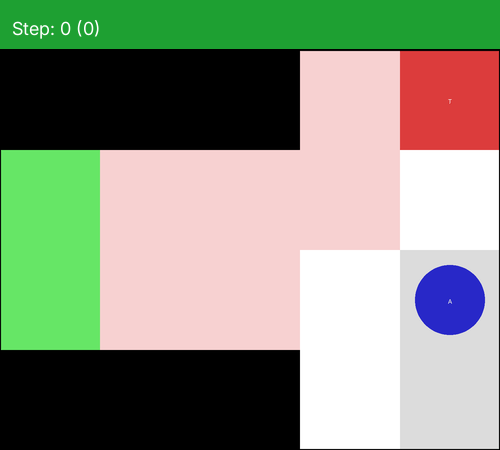

In [ ]:
# BLOCK 8: save gif and print top habit policies
gif_path = "h_disc_k16_c12_075x2_444.gif"
imageio.mimsave(gif_path, frames, fps=10)
print(f"Saved {gif_path}")
display(Image(gif_path))

In [ ]:
# ---------- Utilities for plotting (paste first) ----------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch, Rectangle, Circle
from matplotlib import gridspec

def heatvec_to_grid(vec, rows, cols, mask, state_idx_to_rc):
    """
    Convert a vector of length n_states (compact) -> rows x cols grid with zeros on masked cells.
    """
    grid = np.zeros((rows, cols), dtype=float)
    n = len(vec)
    for idx in range(n):
        r,c = state_idx_to_rc(int(idx))
        grid[r, c] = float(vec[idx])
    # keep blocked cells NaN so they show as gray/white when plotted with mask
    grid_masked = np.where(mask, grid, np.nan)
    return grid_masked

def plot_grid_base(ax, cell_size=1.0, show_coords=False):
    """Make axes look like a grid (no ticks)"""
    ax.set_xlim(-0.5, cols - 0.5)
    ax.set_ylim(rows - 0.5, -0.5)
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
    if show_coords:
        ax.set_xticks(range(cols))
        ax.set_yticks(range(rows))
    # draw passable vs blocked cells background
    for r in range(rows):
        for c in range(cols):
            if not mask[r, c]:
                ax.add_patch(Rectangle((c-0.5, r-0.5), 1, 1, color=(0.3,0.3,0.3)))
    return ax

def overlay_heatmap(ax, grid, cmap='Reds', alpha=0.7, vmin=None, vmax=None):
    """
    overlay posterior heatmap on the grid. grid should have NaNs for blocked cells.
    """
    img = ax.imshow(grid, cmap=cmap, alpha=alpha, vmin=vmin, vmax=vmax, interpolation='nearest', origin='upper')
    return img

def draw_agent_threat_shelter(ax, agent_state=None, threat_state=None, shelter_indices=None, 
                              agent_color=(0.1,0.1,0.8), threat_color=(0.9,0.2,0.2),
                              shelter_color=(0.4,0.9,0.4)):
    # shelters (possibly multiple)
    if shelter_indices is not None:
        for s in shelter_indices:
            r,c = state_idx_to_rc(int(s))
            ax.add_patch(Rectangle((c-0.5, r-0.5), 1, 1, color=shelter_color, alpha=0.45, ec='k'))
    # threat
    if threat_state is not None:
        r,c = state_idx_to_rc(int(threat_state))
        ax.add_patch(Rectangle((c-0.5, r-0.5), 1, 1, color=threat_color, alpha=0.9, ec='k', linewidth=2))
        ax.text(c, r, "T", color='white', ha='center', va='center', fontsize=12, fontweight='bold')
    # agent
    if agent_state is not None:
        r,c = state_idx_to_rc(int(agent_state))
        circ = Circle((c, r), 0.35, color=agent_color, ec='k', linewidth=2)
        ax.add_patch(circ)
        ax.text(c, r, "A", color='white', ha='center', va='center', fontsize=10, fontweight='bold')
    return ax

def draw_policy_arrows(ax, agent_state, policy_probs, scale=0.45, color='k'):
    """
    policy_probs: length 5 for [up,down,left,right,stay] probabilities.
    Draw arrows on the grid from the agent cell indicating preferred directions.
    scale: multiplier for arrow length.
    """
    r0, c0 = state_idx_to_rc(int(agent_state))
    neighbor_dirs = {
        0: (-1, 0),  # up
        1: (1, 0),   # down
        2: (0, -1),  # left
        3: (0, 1),   # right
        4: (0, 0)    # stay
    }
    max_width = 5.0
    for i, p in enumerate(policy_probs):
        dr, dc = neighbor_dirs[i]
        if i == 4:
            # stay: draw a small circle with size proportional to p
            if p > 1e-3:
                ax.add_patch(Circle((c0, r0), 0.2 + 0.4*p, color=color, alpha=0.7))
            continue
        # compute target cell center (clamped to valid cells)
        r1, c1 = r0 + dr, c0 + dc
        # if outside or blocked, point to the same cell (short arrow)
        if (r1 < 0 or r1 >= rows or c1 < 0 or c1 >= cols) or (not mask[r1, c1]):
            r1, c1 = r0, c0
        # draw arrow
        start = (c0, r0)
        end = (c1, r1)
        # shorten slightly so arrow looks neat
        dx = (end[0] - start[0]) * scale
        dy = (end[1] - start[1]) * scale
        if abs(dx) < 1e-6 and abs(dy) < 1e-6:
            continue
        arr = FancyArrowPatch((start[0], start[1]), (start[0] + dx, start[1] + dy),
                              arrowstyle='->', mutation_scale=10 + max_width*p, linewidth=1.0 + 4.0*p, color=color, alpha=0.9)
        ax.add_patch(arr)
    return ax


Found history with T=1000 steps.
Selected window start=500, end=502, entropy drop=1.6094


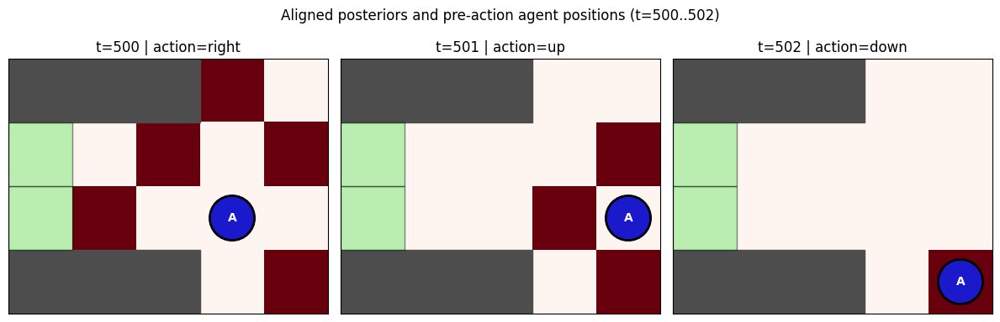

Entropy: [1.60943791e+00 1.09861229e+00 1.04864880e-12]
Top threat candidates (start → end):
 start: [((3, 3), 0.2), ((2, 4), 0.2), ((2, 2), 0.2), ((0, 4), 0.2), ((1, 1), 0.2)]
 end:   [((0, 4), 1.0), ((3, 4), 0.0), ((2, 4), 0.0), ((0, 3), 0.0), ((1, 4), 0.0)]
Diagnostic: (t) pos_pre -> action -> expected_pos_post | stored_pos_post | MATCH?
t=500: pre=(1, 3) (5)  act=3 (right)  -> expected_post=(1, 4) (6)  stored_post=(1, 4) (6)  MATCH=True
t=501: pre=(1, 4) (6)  act=0 (up)  -> expected_post=(0, 4) (1)  stored_post=(0, 4) (1)  MATCH=True
t=502: pre=(0, 4) (1)  act=1 (down)  -> expected_post=(1, 4) (6)  stored_post=(1, 4) (6)  MATCH=True


In [ ]:
# -------------------- Visualize 2-3 step evidence accumulation windows --------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from math import log


# --- entropy helper ---
def entropy_vec(p):
    p = np.asarray(p).ravel()
    p = p / (p.sum() + 1e-12)
    return -np.sum(np.where(p>0, p * np.log(p), 0.0))

# --- check history content ---
if 'history' not in globals():
    raise RuntimeError("Couldn't find `history` in namespace. Run the sim with history saved as in the notebook.")

hist = history
if 'beliefs' not in hist or 'true_state' not in hist:
    raise RuntimeError("history must contain 'beliefs' and 'true_state' saved at each step.")

T = len(hist['beliefs'])
print(f"Found history with T={T} steps.")

# --- compute threat entropy time series and find good candidate windows ---
ent_threat = np.zeros(T)
for t in range(T):
    qs = hist['beliefs'][t]
    q_th = np.asarray(qs[1]).ravel()
    ent_threat[t] = entropy_vec(q_th)

# compute entropy drops over 1-3 step windows
best = None
best_drop = -1.0
for t in range(T-2):
    ent0 = ent_threat[t]
    ent_after = ent_threat[t+2]  # 2 steps ahead
    drop = ent0 - ent_after
    if drop > best_drop:
        best_drop = drop
        best = t

# choose start time
if best is None:
    start = max(0, T-3)
else:
    start = best
end = min(T-1, start+2)
print(f"Selected window start={start}, end={end}, entropy drop={best_drop:.4f}")

# --- Reconstruct modal observations and actions for the window ---
# true threat & shelter are assumed static (as in your sim)
threat_true = int(true_threat_pos)
shelter_true = np.array(true_shelter_pos) if isinstance(true_shelter_pos, (list,tuple,np.ndarray)) else np.array([int(true_shelter_pos)])

def modal_obs_from_true(agent_pos, threat_pos, shelter_indices, A):
    # returns modal obs triple (threat_obs, shelter_obs, agent_obs)
    # compute marginalized emission for shelter multi-cells
    # A[0] threat, A[1] shelter, A[2] agent
    pth = np.zeros(A[0].shape[0])
    psh = np.zeros(A[1].shape[0])
    pag = np.zeros(A[2].shape[0])
    for sh in shelter_indices:
        pth += A[0][:, agent_pos, threat_pos, sh]
        psh += A[1][:, agent_pos, threat_pos, sh]
        pag += A[2][:, agent_pos, threat_pos, sh]
    pth /= len(shelter_indices)
    psh /= len(shelter_indices)
    pag /= len(shelter_indices)
    # pick argmax (modal) for display
    return int(np.argmax(pth)), int(np.argmax(psh)), int(np.argmax(pag)), pth, psh, pag

# ---- cleaner figure for threat posterior collapse window ----
# corrected plotting: show posterior at t but agent position at t (pre-action)
# If your history stores true_state AFTER step, use prev position to align:
def plot_aligned_window(history, start, end):
    steps = list(range(start, end+1))
    n = len(steps)
    fig, axs = plt.subplots(1, n, figsize=(4*n,4))
    if n==1:
        axs = [axs]
    for i, t in enumerate(steps):
        # posterior at t (this was computed before action in your loop)
        q_th = np.asarray(history['beliefs'][t][1]).ravel()
        # aligned agent position: use the pre-action position that led to this posterior
        # that is history['true_state'][t-1] if the loop appended true_state after stepping
        aligned_pos_idx = history['true_state'][t-1] if (t-1) >= 0 else history['true_state'][t]
        ax = axs[i]
        plot_grid_base(ax)
        grid = heatvec_to_grid(q_th, rows, cols, mask, state_idx_to_rc)
        im = ax.imshow(grid, cmap='Reds', origin='upper', vmin=0, vmax=grid[~np.isnan(grid)].max())
        # draw agent at the aligned (pre-action) position
        draw_agent_threat_shelter(ax, agent_state=aligned_pos_idx, threat_state=None, shelter_indices=true_shelter_pos)
        action = history['actions'][t] if 'actions' in history else None
        ax.set_title(f"t={t} | action={actions[action] if action is not None else '?'}")
    plt.suptitle(f"Aligned posteriors and pre-action agent positions (t={start}..{end})")
    # plt.colorbar(im, ax=axs, fraction=0.046, pad=0.02)
    plt.tight_layout(rect=[0,0.03,1,0.95])
    plt.show()

# example usage (use your previously selected start/end)
%matplotlib inline
plot_aligned_window(history, start, end)


# --- concise console summary ---
print(f"Entropy: {ent_threat[start:end+1]}")
print("Top threat candidates (start → end):")
start_q = np.asarray(hist['beliefs'][start][1]).ravel()
end_q = np.asarray(hist['beliefs'][end][1]).ravel()
print(" start:", [(state_idx_to_rc(int(i)), round(float(start_q[i]),2)) for i in np.argsort(start_q)[-5:][::-1]])
print(" end:  ", [(state_idx_to_rc(int(i)), round(float(end_q[i]),2)) for i in np.argsort(end_q)[-5:][::-1]])

# Diagnosis: check consistency between stored beliefs, actions, and true_state
start, end = start, end  # uses the start/end you previously selected
print("Diagnostic: (t) pos_pre -> action -> expected_pos_post | stored_pos_post | MATCH?")
for t in range(start, end+1):
    # pre-action pos that should correspond to posterior at t
    pos_pre = history['true_state'][t-1] if (t-1) >= 0 else history['true_state'][t]
    recorded_action = history['actions'][t] if ('actions' in history and len(history['actions'])>t) else None
    expected_post = None
    if recorded_action is not None:
        expected_post = step_from_state(int(pos_pre), int(recorded_action))
    stored_post = history['true_state'][t] if ('true_state' in history and len(history['true_state'])>t) else None
    match = (expected_post == stored_post)
    print(f"t={t}: pre={state_idx_to_rc(pos_pre)} ({pos_pre})  act={recorded_action} ({actions[recorded_action] if recorded_action is not None else None})  -> expected_post={state_idx_to_rc(expected_post) if expected_post is not None else None} ({expected_post})  stored_post={state_idx_to_rc(stored_post) if stored_post is not None else None} ({stored_post})  MATCH={match}")



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle, FancyArrowPatch
from matplotlib import cm, colors

# --- Set your desired scaling factor here ---
scale_factor = 3

# --- Update global Matplotlib defaults to scale with the factor ---
# This scales titles, labels, and other text that doesn't have a hard-coded size.
plt.rcParams.update({
    'font.size': 10 * scale_factor,
    'axes.titlesize': 12 * scale_factor,      # Title font size for individual subplots
    'figure.titlesize': 14 * scale_factor,     # Title font size for the whole figure (suptitle)
    'axes.labelsize': 11 * scale_factor,      # Font size for axis labels (e.g., colorbar label)
    'legend.fontsize': 10 * scale_factor,
    'xtick.labelsize': 9 * scale_factor,       # Font size for x-axis tick labels
    'ytick.labelsize': 9 * scale_factor        # Font size for y-axis tick labels
})


def draw_cell_heat(ax, r, c, value, cmap, vmin=0.0, vmax=1.0, zorder=0):
    """Draw a single cell at row r, col c as a colored rectangle using value->color."""
    # map value -> RGBA using colormap
    norm = colors.Normalize(vmin=vmin, vmax=vmax)
    rgba = cmap(norm(value))
    # MODIFIED: Scale linewidth
    ax.add_patch(Rectangle((c-0.5, r-0.5), 1.0, 1.0, color=rgba, ec='k', linewidth=0.6 * scale_factor, zorder=zorder))

def draw_grid_rectangles(ax, vec, cmap=cm.Reds, vmin=None, vmax=None):
    """Draw the entire grid by rectangles for valid (passable) cells only."""
    # compute vmin/vmax if not provided
    vals = [float(vec[i]) for i in range(len(vec))]
    if vmin is None:
        vmin = 0.0
    if vmax is None:
        vmax = max(1e-12, max(vals))
    # draw for each cell
    for idx in range(len(state_to_rc)):
        r,c = state_idx_to_rc(int(idx))
        # This function calls draw_cell_heat, which is now scaled
        draw_cell_heat(ax, r, c, float(vec[idx]), cmap=cmap, vmin=vmin, vmax=vmax, zorder=1)

def draw_blocked_and_shelters(ax):
    # blocked cells background
    for r in range(rows):
        for c in range(cols):
            if not mask[r,c]:
                ax.add_patch(Rectangle((c-0.5, r-0.5), 1, 1, color=(0.25,0.25,0.25), zorder=0))
    # shelter cells (green)
    shs = true_shelter_pos if isinstance(true_shelter_pos, (list,tuple,np.ndarray)) else [true_shelter_pos]
    for s in shs:
        rr, cc = state_idx_to_rc(int(s))
        # MODIFIED: Scale linewidth
        ax.add_patch(Rectangle((cc-0.5, rr-0.5), 1, 1, color=(0.6,1.0,0.6), ec='k', linewidth=1 * scale_factor, zorder=2))

# --- Fixed-scale version for consistent color normalization across steps ---
def plot_triplet_rects(history, t, cmap=cm.Reds):
    """Plot Prior (t), Action, Posterior (t+1) using rectangle grid drawing (unambiguous)."""
    # fetch data
    q_t = np.asarray(history['beliefs'][t][1]).ravel()
    pos_pre = history['true_state'][t-1] if (t-1) >= 0 else history['true_state'][t]
    action_t = history['actions'][t]
    expected_post = step_from_state(int(pos_pre), int(action_t))
    stored_post = history['true_state'][t]
    q_t1 = np.asarray(history['beliefs'][t+1][1]).ravel() if (t+1) < len(history['beliefs']) else None

    # ----- FIXED color normalization -----
    vmin, vmax = 0.0, 1.0  # consistent across all steps

    extent = (-0.5, cols-0.5, -0.5, rows-0.5)
    # MODIFIED: Scale figsize
    fig, axs = plt.subplots(1, 3, figsize=(14 * scale_factor, 4 * scale_factor), constrained_layout=True)
    for ax in axs:
        ax.set_xlim(extent[0], extent[1])
        ax.set_ylim(extent[3], extent[2])  # top origin behavior
        ax.set_aspect('equal'); ax.set_xticks([]); ax.set_yticks([])

    # Panel 1: prior (q_t)
    ax = axs[0]
    draw_blocked_and_shelters(ax)
    draw_grid_rectangles(ax, q_t, cmap=cmap, vmin=vmin, vmax=vmax)
    rA, cA = state_idx_to_rc(int(pos_pre))
    # MODIFIED: Scale linewidth
    ax.add_patch(Circle((cA, rA), 0.35, color=(0.05,0.2,0.95), ec='k', linewidth=2 * scale_factor, zorder=10))
    # MODIFIED: Scale fontsize
    ax.text(0.02, 0.96, f"top idx {int(np.argmax(q_t))} at {state_idx_to_rc(int(np.argmax(q_t)))}",
            transform=ax.transAxes, fontsize=9 * scale_factor,
            bbox=dict(facecolor='white', alpha=0.8))
    # Title font size is set automatically by rcParams
    ax.set_title(f"t={t} Prior (pre-action)\n(ent={entropy_vec(q_t):.3f})")

    # Panel 2: action & expected post
    ax = axs[1]
    draw_blocked_and_shelters(ax)
    # MODIFIED: Scale linewidth
    ax.add_patch(Circle((cA, rA), 0.35, color=(0.05,0.2,0.95), ec='k', linewidth=2 * scale_factor, zorder=10))
    rE, cE = state_idx_to_rc(int(expected_post))
    # MODIFIED: Scale linewidth
    ax.add_patch(Circle((cE, rE), 0.30, color=(0.85,0.25,0.25), ec='k', linewidth=1.2 * scale_factor, zorder=9))
    # MODIFIED: Scale mutation_scale and linewidth
    arr = FancyArrowPatch((cA, rA), (cE, rE), arrowstyle='->',
                          mutation_scale=18 * scale_factor, linewidth=3 * scale_factor, color='navy', zorder=11)
    ax.add_patch(arr)
    # MODIFIED: Scale fontsize
    ax.text(0.02, 0.96, f"action: {actions[action_t]}",
            transform=ax.transAxes, fontsize=10 * scale_factor,
            bbox=dict(facecolor='white', alpha=0.8))
    # Title font size is set automatically by rcParams
    ax.set_title("Action (planned)")

    # Panel 3: posterior at t+1
    ax = axs[2]
    draw_blocked_and_shelters(ax)
    if q_t1 is not None:
        draw_grid_rectangles(ax, q_t1, cmap=cmap, vmin=vmin, vmax=vmax)
    rS, cS = state_idx_to_rc(int(stored_post))
    # MODIFIED: Scale linewidth
    ax.add_patch(Circle((cS, rS), 0.35, color=(0.05,0.2,0.95), ec='k', linewidth=2 * scale_factor, zorder=10))
    # Title font size is set automatically by rcParams
    ax.set_title(f"t={t+1} Posterior (post-action)\n(ent={entropy_vec(q_t1):.3f})"
                 if q_t1 is not None else "Posterior (post-action)")

    # shared colorbar (always 0→1)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=colors.Normalize(vmin=vmin, vmax=vmax))
    sm.set_array([])
    # Colorbar label font size is set automatically by rcParams
    # fraction and pad are relative layout parameters, they should not be scaled.
    fig.colorbar(sm, ax=axs.ravel().tolist(), fraction=0.046, pad=0.01, label='p(threat)')

    # Super-title font size is set automatically by rcParams
    plt.suptitle(f"Prior → Action → Posterior (t={t})  — rectangle-based drawing (fixed 0–1 scale)")
    plt.show()


    # print diagnostics
    top_idx = int(np.argmax(q_t))
    print("Diagnostics:")
    print(" top posterior idx:", top_idx, " state_idx_to_rc(top_idx) =", state_idx_to_rc(top_idx))
    print(" pos_pre:", state_idx_to_rc(pos_pre), " expected_post:", state_idx_to_rc(expected_post), " stored_post:", state_idx_to_rc(stored_post))

# --- Assumes all your other variables (history, state_idx_to_rc, etc.) are defined ---
# run for your verified t
plot_triplet_rects(history, 498)

NameError: name 'history' is not defined

Built interesting_history with: 6 belief entries and 5 true_state entries (n_steps= 5 )
Start original time: 499
interesting_history true_state (post-action positions): [(1, 3), (1, 4), (0, 4), (1, 4), (1, 3)]
Top threats (pre -> post manual) indices:
 pre top: 1 (0, 4)
 post step 1: top idx 1 rc (0, 4) maxp 0.333
 post step 2: top idx 1 rc (0, 4) maxp 0.500
 post step 3: top idx 1 rc (0, 4) maxp 1.000
 post step 4: top idx 1 rc (0, 4) maxp 1.000
 post step 5: top idx 1 rc (0, 4) maxp 1.000


/tmp/ipykernel_10366/318846714.py:12: RuntimeWarning: divide by zero encountered in log
  return -np.sum(np.where(p>0, p * np.log(p), 0.0))
/tmp/ipykernel_10366/318846714.py:12: RuntimeWarning: invalid value encountered in multiply
  return -np.sum(np.where(p>0, p * np.log(p), 0.0))


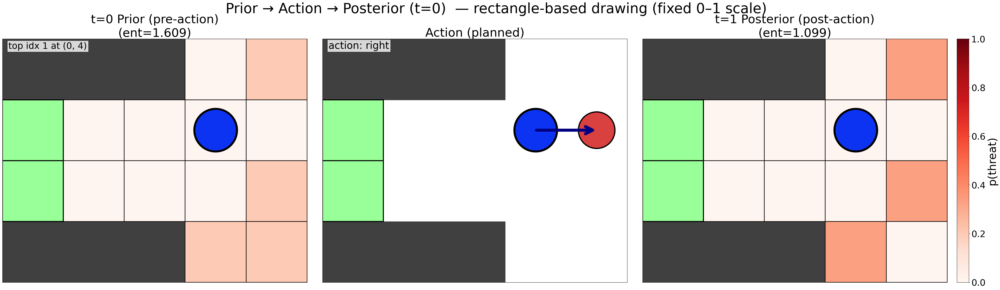

Diagnostics:
 top posterior idx: 1  state_idx_to_rc(top_idx) = (0, 4)
 pos_pre: (1, 3)  expected_post: (1, 4)  stored_post: (1, 3)


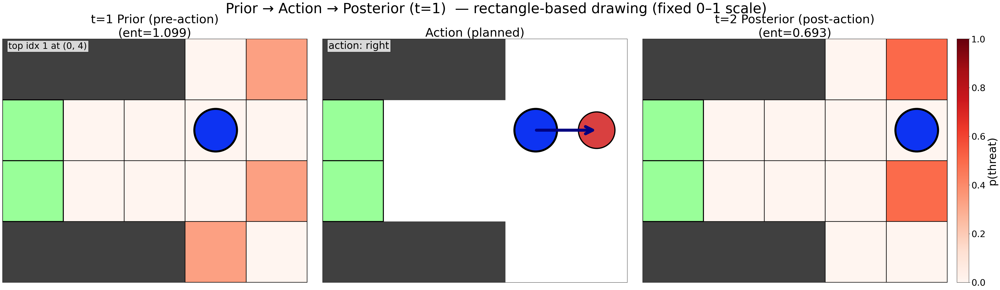

Diagnostics:
 top posterior idx: 1  state_idx_to_rc(top_idx) = (0, 4)
 pos_pre: (1, 3)  expected_post: (1, 4)  stored_post: (1, 4)


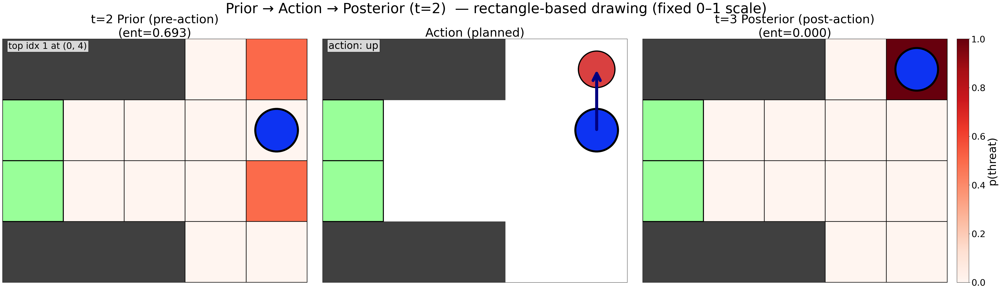

Diagnostics:
 top posterior idx: 1  state_idx_to_rc(top_idx) = (0, 4)
 pos_pre: (1, 4)  expected_post: (0, 4)  stored_post: (0, 4)


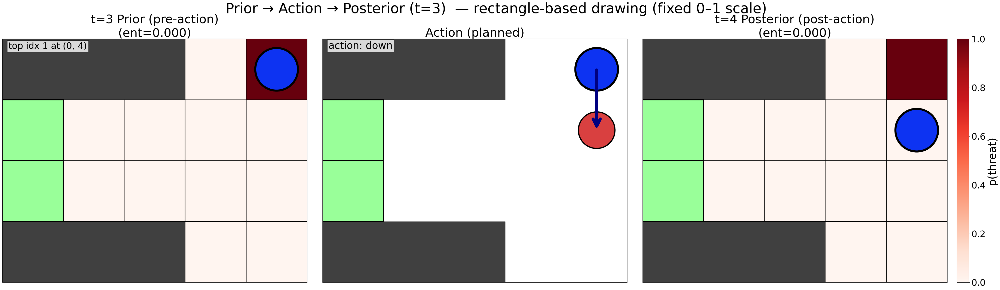

Diagnostics:
 top posterior idx: 1  state_idx_to_rc(top_idx) = (0, 4)
 pos_pre: (0, 4)  expected_post: (1, 4)  stored_post: (1, 4)


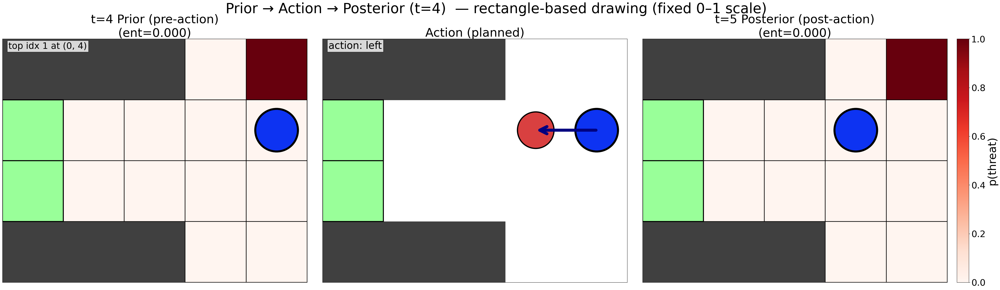

Diagnostics:
 top posterior idx: 1  state_idx_to_rc(top_idx) = (0, 4)
 pos_pre: (1, 4)  expected_post: (1, 3)  stored_post: (1, 3)


In [ ]:
# -------------------- Build manual-Bayes "interesting_history" --------------------
import numpy as np
from copy import deepcopy

# USER CONFIG: choose a start time in your saved history and number of manual-update steps
start_t = 499   # e.g., verified_t or any index from your saved history
n_steps = 5            # how many manual observation updates to perform (creates beliefs length = n_steps+1)

# safety checks
if 'history' not in globals():
    raise RuntimeError("Cannot find `history` in workspace. Run your simulation so `history` is available.")

T = len(history['beliefs'])
if start_t < 0 or start_t >= T:
    raise ValueError("start_t out of range of saved history length.")

# helper: assemble shelter indices
if isinstance(true_shelter_pos, (list, tuple, np.ndarray)):
    shelter_indices = [int(x) for x in true_shelter_pos]
else:
    shelter_indices = [int(true_shelter_pos)]

# A_threat convenience
A_threat = A[0]   # shape: (n_threat_obs, n_agent, n_threat, n_shelter)
n_threat = A_threat.shape[2]
n_th_obs = A_threat.shape[0]

def modal_obs_at(agent_pos, threat_pos):
    """Return the modal threat observation index (argmax over emissions) for the true threat at agent_pos."""
    p = np.zeros(n_th_obs)
    for sh in shelter_indices:
        p += A_threat[:, agent_pos, threat_pos, sh]
    p /= len(shelter_indices)
    return int(np.argmax(p)), p

def likelihood_vec_for_obs(agent_pos, obs_k):
    """Return vector lik_vec[i] = P(o=obs_k | threat=i, agent_pos) marginalizing shelter cells."""
    lik = np.zeros(n_threat)
    for i_th in range(n_threat):
        p_vec = np.zeros(n_th_obs)
        for sh in shelter_indices:
            p_vec += A_threat[:, agent_pos, i_th, sh]
        p_vec /= len(shelter_indices)
        lik[i_th] = float(p_vec[obs_k])
    return lik

# Build interesting_history
interesting_history = {'beliefs': [], 'true_state': [], 'actions': [], 'policy_idx': []}

# initial pre-action belief (use copy to avoid aliasing)
init_belief_entry = deepcopy(history['beliefs'][start_t])  # this is the pre-action belief at original start_t
interesting_history['beliefs'].append(deepcopy(init_belief_entry))

# Fill true_state[0..n_steps-1] and actions[0..n_steps-1] from original history
# We align so that: for k in [0..n_steps-1]:
#   - interesting_history['true_state'][k] = history['true_state'][start_t + k] (the place where obs was sampled)
#   - interesting_history['actions'][k]    = history['actions'][start_t + k] (action chosen at that original time)
for k in range(n_steps):
    orig_idx = start_t + k
    if orig_idx >= len(history['true_state']) or orig_idx >= len(history['actions']):
        # stop early if we don't have enough saved steps
        n_steps = k
        break
    interesting_history['true_state'].append(int(history['true_state'][orig_idx]))
    interesting_history['actions'].append(int(history['actions'][orig_idx]))
    # policy_idx if present
    if 'policy_idx' in history and len(history['policy_idx']) > orig_idx:
        interesting_history['policy_idx'].append(int(history['policy_idx'][orig_idx]))
    else:
        interesting_history['policy_idx'].append(None)

# Now perform manual Bayes updates step-by-step and append resulting belief entries
# We'll create beliefs[1], beliefs[2], ... up to beliefs[n_steps] corresponding to posteriors after each observation.
q_prev_entry = deepcopy(init_belief_entry)  # a list-like [q_agent, q_threat, q_shelter]
# ensure threat vector is numpy array
q_prev_th = np.asarray(q_prev_entry[1]).ravel().astype(float)

for k in range(n_steps):
    agent_post_pos = int(interesting_history['true_state'][k])   # where observation was sampled
    # Determine modal obs for the *true* threat (so we use the actual observed outcome)
    obs_k, p_obs_given_true = modal_obs_at(agent_post_pos, int(true_threat_pos))
    # Build likelihood vector for that observed outcome
    lik_vec = likelihood_vec_for_obs(agent_post_pos, obs_k)
    # Manual Bayes: posterior ∝ prior * likelihood
    unn = lik_vec * q_prev_th
    if unn.sum() <= 0:
        # numerical fallback: add very small uniform noise so we can normalize
        unn = lik_vec * q_prev_th + 1e-12
    q_post_th = unn / (unn.sum() + 1e-16)

    # Build a full belief entry: for agent factor we set one-hot at agent_post_pos (proprioceptive)
    q_agent_onehot = np.zeros_like(q_prev_entry[0], dtype=float) if isinstance(q_prev_entry[0], (list,tuple,np.ndarray)) else np.zeros(n_agent)
    try:
        q_agent_onehot = np.zeros(len(q_prev_entry[0]), dtype=float)
    except Exception:
        q_agent_onehot = np.zeros(n_agent, dtype=float)
    # set one-hot (if agent_obs factor size equals n_agent)
    if len(q_agent_onehot) == n_agent:
        q_agent_onehot[agent_post_pos] = 1.0
    else:
        # fallback: keep previous agent belief if shapes mismatch
        q_agent_onehot = np.asarray(q_prev_entry[0]).ravel().astype(float)

    # For shelter factor keep prior as in previous entry (or recompute if you want)
    q_shel_prev = np.asarray(q_prev_entry[2]).ravel().astype(float)

    new_belief_entry = [q_agent_onehot.copy(), q_post_th.copy(), q_shel_prev.copy()]
    interesting_history['beliefs'].append(new_belief_entry)

    # prepare for next iteration
    q_prev_entry = deepcopy(new_belief_entry)
    q_prev_th = np.asarray(q_prev_entry[1]).ravel().astype(float)

# Trim lists lengths to be consistent: beliefs length = n_steps+1, true_state/actions length = n_steps
# This matches the plotting helper expectation: beliefs[t] is pre-action at original time,
# beliefs[t+1] is posterior after observation at true_state[t] (post-action position).
print("Built interesting_history with:", len(interesting_history['beliefs']), "belief entries and",
      len(interesting_history['true_state']), "true_state entries (n_steps=", n_steps, ")")

# quick sanity prints
print("Start original time:", start_t)
print("interesting_history true_state (post-action positions):", [state_idx_to_rc(x) for x in interesting_history['true_state']])
print("Top threats (pre -> post manual) indices:")
print(" pre top:", int(np.argmax(interesting_history['beliefs'][0][1])), state_idx_to_rc(int(np.argmax(interesting_history['beliefs'][0][1]))))
for i in range(1, len(interesting_history['beliefs'])):
    post_q = np.asarray(interesting_history['beliefs'][i][1]).ravel()
    print(f" post step {i}: top idx {int(np.argmax(post_q))} rc {state_idx_to_rc(int(np.argmax(post_q)))} maxp {float(post_q.max()):.3f}")

# now you can run:
for i in range(n_steps):
    plot_triplet_rects(interesting_history, i)

# to visualize prior (beliefs[0]) -> action (actions[0]) -> manual posterior (beliefs[1]),
# and step through the manual updates by calling plot_triplet_rects(interesting_history, k) for k in 0..n_steps-1.


In [ ]:
# overwrite history posterior at t+1 with manual posterior (for visualization / downstream analysis)
t = 500
if (t+1) < len(history['beliefs']):
    new_q = manual_post.copy()
    # maintain the same structure but replace factor 1 (threat) posterior
    q_entry = history['beliefs'][t+1]   # expect it's a list/array like [q_agent, q_threat, q_shelter]
    # create safe copy depending on structure
    try:
        new_q_entry = [np.asarray(q_entry[0]).copy(), new_q.copy(), np.asarray(q_entry[2]).copy()]
    except Exception:
        # fallback: if q_entry is an array-like of arrays
        new_q_entry = list(q_entry)
        new_q_entry[1] = new_q.copy()
    history['beliefs'][t+1] = new_q_entry
    print(f"history['beliefs'][{t+1}] replaced with manual posterior for threat.")
else:
    print("No stored posterior at t+1 to overwrite.")


history['beliefs'][501] replaced with manual posterior for threat.


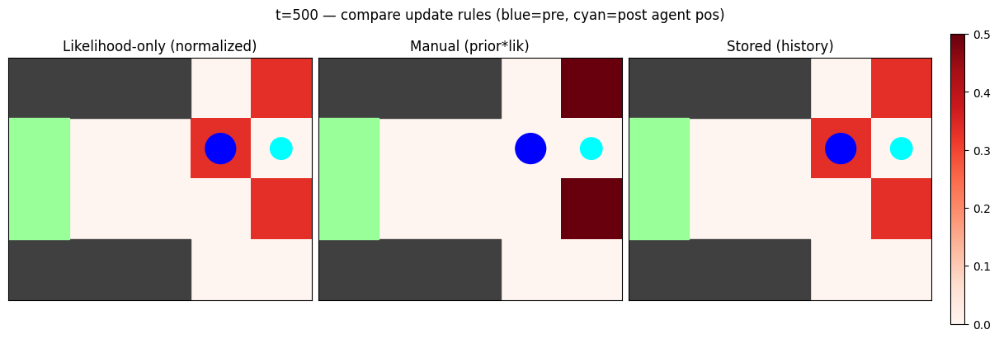

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from matplotlib import cm, colors

def grid_from_vec(vec):
    g = np.full((rows, cols), np.nan)
    for i,v in enumerate(vec):
        r,c = state_idx_to_rc(i)
        g[r,c] = float(v)
    return g

# build three candidate posteriors
lik_only = lik_vec / (lik_vec.sum()+1e-16)
manual = manual_post
stored = q_post if q_post is not None else np.zeros_like(manual)

g_lik = grid_from_vec(lik_only)
g_man = grid_from_vec(manual)
g_store = grid_from_vec(stored)

vmax = max(g_lik[~np.isnan(g_lik)].max(), g_man[~np.isnan(g_man)].max(), g_store[~np.isnan(g_store)].max())

fig, axs = plt.subplots(1, 3, figsize=(12,4), constrained_layout=True)
titles = ['Likelihood-only (normalized)', 'Manual (prior*lik)', 'Stored (history)']
grids = [g_lik, g_man, g_store]
for ax, grid, title in zip(axs, grids, titles):
    ax.imshow(grid, cmap='Reds', origin='upper', vmin=0, vmax=vmax)
    ax.set_xticks([]); ax.set_yticks([])
    # blocked cells
    for r in range(rows):
        for c in range(cols):
            if not mask[r,c]:
                ax.add_patch(Rectangle((c-0.5,r-0.5),1,1,color=(0.25,0.25,0.25)))
    # shelter
    for sh in (true_shelter_pos if isinstance(true_shelter_pos,(list,tuple,np.ndarray)) else [true_shelter_pos]):
        rr,cc = state_idx_to_rc(int(sh))
        ax.add_patch(Rectangle((cc-0.5,rr-0.5),1,1,color=(0.6,1,0.6)))
    # agent positions
    r_pre, c_pre = state_idx_to_rc(true_agent_pre)
    r_post, c_post = state_idx_to_rc(true_agent_post)
    ax.add_patch(Circle((c_pre, r_pre), 0.25, color='blue', zorder=5))
    ax.add_patch(Circle((c_post, r_post), 0.18, color='cyan', zorder=6))
    ax.set_title(title)
plt.suptitle(f"t={t} — compare update rules (blue=pre, cyan=post agent pos)")
plt.colorbar(axs[0].images[0], ax=axs, fraction=0.046, pad=0.02)
plt.show()


In [ ]:
import numpy as np
from pprint import pprint

# pick the timestep you inspected (e.g., verified_t or your window start)
t = 635  # e.g., 638 or 706 whichever you looked at

# previous posterior (pre-action) for threat
q_prev = np.asarray(history['beliefs'][t][1]).ravel()   # belief at t (pre-action)
# stored posterior after the update (post-action)
q_post = np.asarray(history['beliefs'][t+1][1]).ravel() if (t+1) < len(history['beliefs']) else None

print("t =", t)
print("Pre-action top threat (idx, rc, p):", int(np.argmax(q_prev)), state_idx_to_rc(int(np.argmax(q_prev))), float(np.max(q_prev)))
if q_post is not None:
    print("Post-action top threat (idx, rc, p):", int(np.argmax(q_post)), state_idx_to_rc(int(np.argmax(q_post))), float(np.max(q_post)))

# what observation was actually sampled at t+1?  We can reconstruct the modal obs from your true states
true_agent_pre = int(history['true_state'][t-1]) if (t-1)>=0 else int(history['true_state'][t])
true_agent_post = int(history['true_state'][t])
true_threat = int(true_threat_pos)
true_shelter = np.array(true_shelter_pos) if isinstance(true_shelter_pos,(list,tuple,np.ndarray)) else np.array([int(true_shelter_pos)])

print("true agent pre (pos used for q_prev):", state_idx_to_rc(true_agent_pre))
print("true agent post (position where new obs was sampled):", state_idx_to_rc(true_agent_post))
# compute likelihood P(o_threat | agent_post, threat, shelter) and find modal obs
A_threat = A[0]  # shape (n_threat_obs, n_agent, n_threat, n_shelter)
# marginalize across shelter-cells if multiple
shelter_indices = list(true_shelter)
p_o = np.zeros(A_threat.shape[0])
for sh in shelter_indices:
    p_o += A_threat[:, true_agent_post, :, sh].sum(axis=1) if False else A_threat[:, true_agent_post, :, sh]  # we'll inspect per threat
# actually inspect full matrix per-threat
lik_matrix = np.zeros((len(q_prev), A_threat.shape[0]))  # shape (n_threat, n_obs)
for i_th in range(len(q_prev)):
    # p(o | threat=i, agent=post, marginalize shelter)
    p_vec = np.zeros(A_threat.shape[0])
    for sh in shelter_indices:
        p_vec += A_threat[:, true_agent_post, i_th, sh]
    p_vec /= len(shelter_indices)
    lik_matrix[i_th, :] = p_vec

print("\nSample of likelihood P(o_threat | agent_post, threat=i) for a few threat indices:")
for i in range(len(q_prev)):
    if q_prev[i] > 0 or (i in np.argsort(q_prev)[-8:]):  # show ones with mass and some with small mass
        print(f" idx {i} rc {state_idx_to_rc(i)} prior={q_prev[i]:.3f}  lik(o=0..):", np.round(lik_matrix[i,:],3))

# pick the observed threat outcome by modal likelihood under true threat and shelter
p_obs_given_true = np.zeros(A_threat.shape[0])
for sh in shelter_indices:
    p_obs_given_true += A_threat[:, true_agent_post, true_threat, sh]
p_obs_given_true /= len(shelter_indices)
obs_sampled = int(np.argmax(p_obs_given_true))
print("\nModal threat observation at agent_post:", obs_sampled, "p(obs|true_threat)=", np.round(p_obs_given_true,3))


t = 635
Pre-action top threat (idx, rc, p): 1 (0, 4) 0.20000000000000043
Post-action top threat (idx, rc, p): 1 (0, 4) 0.20000000000000046
true agent pre (pos used for q_prev): (1, 2)
true agent post (position where new obs was sampled): (2, 2)


ValueError: operands could not be broadcast together with shapes (4,) (4,14) (4,) 

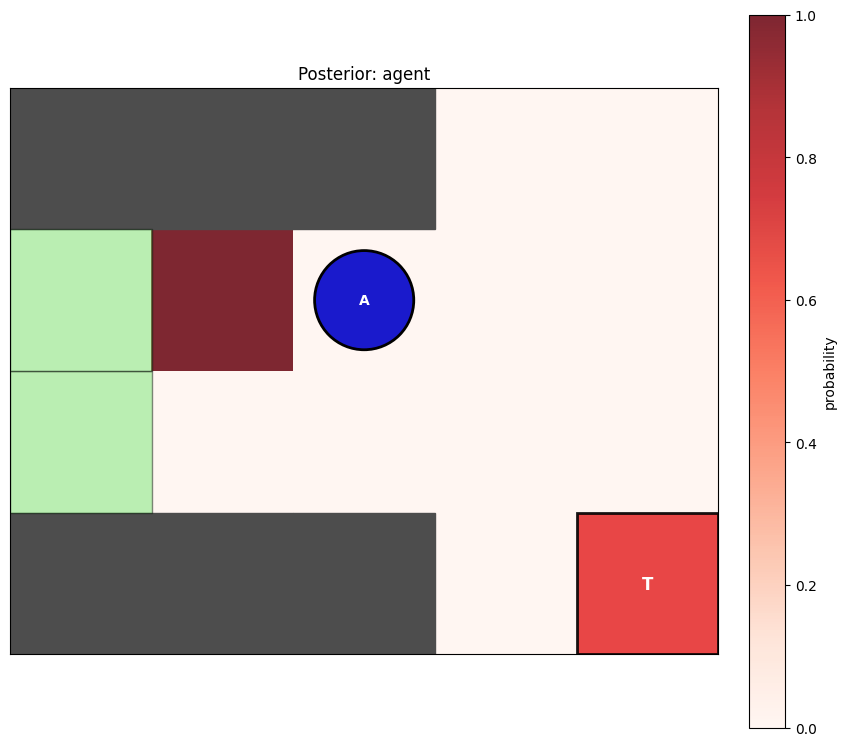

In [ ]:
# ---------- Single posterior heatmap on grid ----------
def plot_single_posterior(which='threat', q=None, agent_state=None, threat_state=None, shelter_indices=None,
                          cmap='Reds', figsize=(10,10), vmin=None, vmax=None):
    """
    which: 'agent' / 'threat' / 'shelter' -- used for title and default colormap suggestion
    q: if provided, must be the compact posterior vector for that factor (length n_states).
       Otherwise uses agent_obj.qs (expects agent_obj.qs indices: 0 agent, 1 threat, 2 shelter).
    """
    if q is None:
        if which == 'agent':
            q = np.array(agent_obj.qs[0])
        elif which == 'threat':
            q = np.array(agent_obj.qs[1])
        elif which == 'shelter':
            q = np.array(agent_obj.qs[2])
        else:
            raise ValueError("which must be 'agent'/'threat'/'shelter'")

    grid = heatvec_to_grid(q, rows, cols, mask, state_idx_to_rc)

    fig, ax = plt.subplots(figsize=figsize)
    plot_grid_base(ax)
    img = overlay_heatmap(ax, grid, cmap=cmap, alpha=0.85, vmin=vmin, vmax=vmax)
    # draw true entities for context
    draw_agent_threat_shelter(ax, agent_state=agent_state, threat_state=threat_state, shelter_indices=shelter_indices)
    plt.title(f"Posterior: {which}")
    plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04, label='probability')
    plt.show()

# Example usage:
plot_single_posterior('agent', agent_state=true_agent_pos, threat_state=true_threat_pos, shelter_indices=true_shelter_pos)


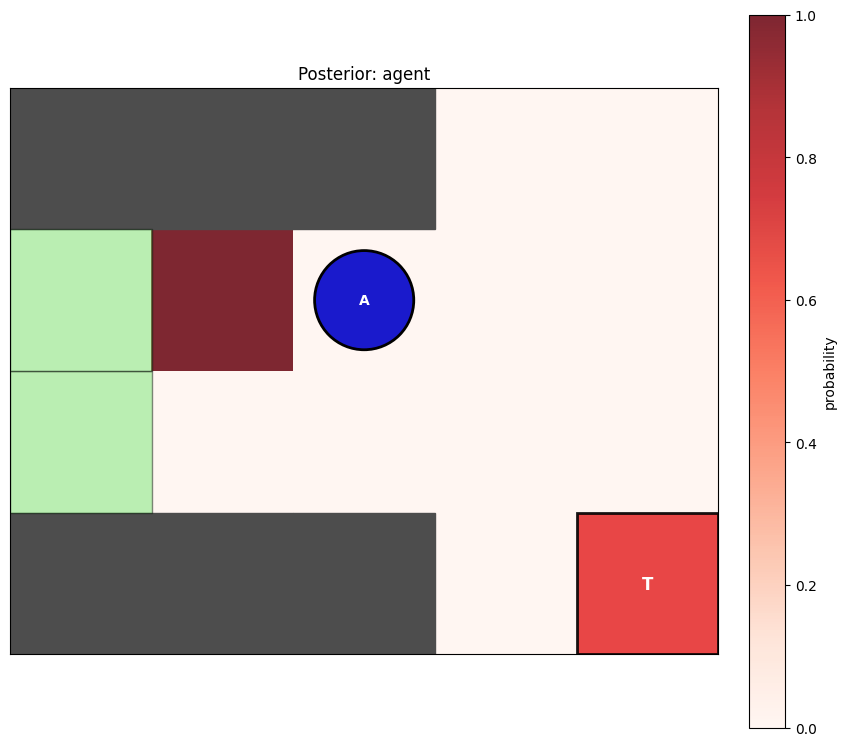

In [ ]:
%matplotlib inline

plot_single_posterior('agent', agent_state=true_agent_pos, threat_state=true_threat_pos, shelter_indices=true_shelter_pos)


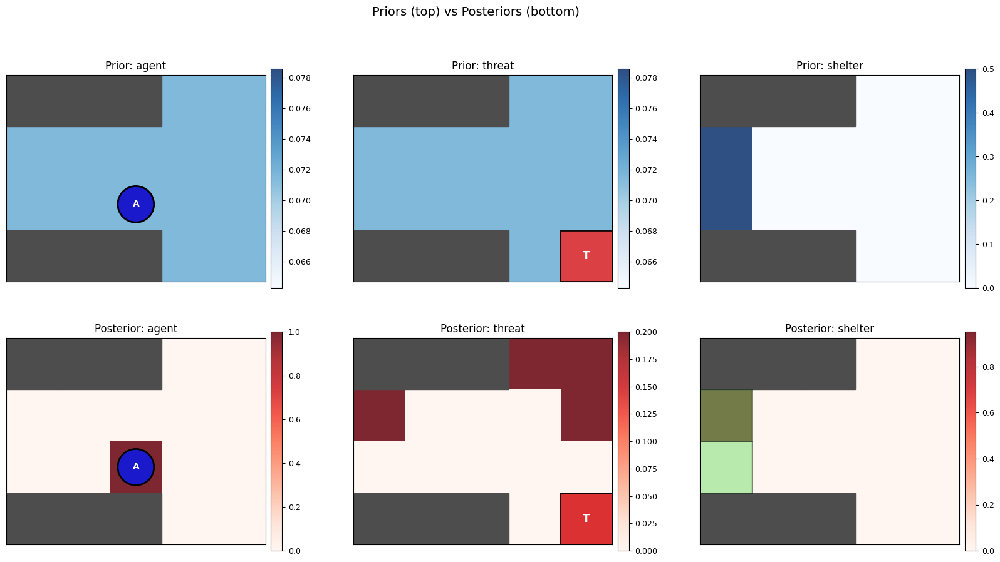

In [ ]:
# ---------- Priors vs Posteriors ----------
def plot_priors_posteriors(D_obj, agent_obj, agent_state=None, threat_state=None, shelter_indices=None, figsize=(20,10)):
    """
    D_obj: object-array of priors [D_agent, D_threat, D_shelter]
    agent_obj: expects .qs attribute (list/array of posteriors for [agent, threat, shelter])
    """
    factor_names = ['agent', 'threat', 'shelter']
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(2, 3, height_ratios=[1,1], wspace=0.25)
    for i, name in enumerate(factor_names):
        # prior
        axp = fig.add_subplot(gs[0, i])
        plot_grid_base(axp)
        prior_vec = D_obj[i]
        prior_grid = heatvec_to_grid(prior_vec, rows, cols, mask, state_idx_to_rc)
        imgp = axp.imshow(prior_grid, cmap='Blues', alpha=0.85, interpolation='nearest', origin='upper')
        draw_agent_threat_shelter(axp, agent_state=agent_state if name=='agent' else None,
                                  threat_state=threat_state if name=='threat' else None,
                                  shelter_indices=None if name=='shelter' else None)
        axp.set_title(f"Prior: {name}")
        plt.colorbar(imgp, ax=axp, fraction=0.046, pad=0.02)

        # posterior
        axq = fig.add_subplot(gs[1, i])
        plot_grid_base(axq)
        q = np.array(agent_obj.qs[i])
        q_grid = heatvec_to_grid(q, rows, cols, mask, state_idx_to_rc)
        imgq = axq.imshow(q_grid, cmap='Reds', alpha=0.85, interpolation='nearest', origin='upper')
        draw_agent_threat_shelter(axq, agent_state=agent_state if name=='agent' else None,
                                  threat_state=threat_state if name=='threat' else None,
                                  shelter_indices=shelter_indices if name=='shelter' else None)
        axq.set_title(f"Posterior: {name}")
        plt.colorbar(imgq, ax=axq, fraction=0.046, pad=0.02)

    plt.suptitle("Priors (top) vs Posteriors (bottom)")
    plt.show()

# Example usage:
plot_priors_posteriors(D, agent_obj, agent_state=true_agent_pos, threat_state=true_threat_pos, shelter_indices=true_shelter_pos)


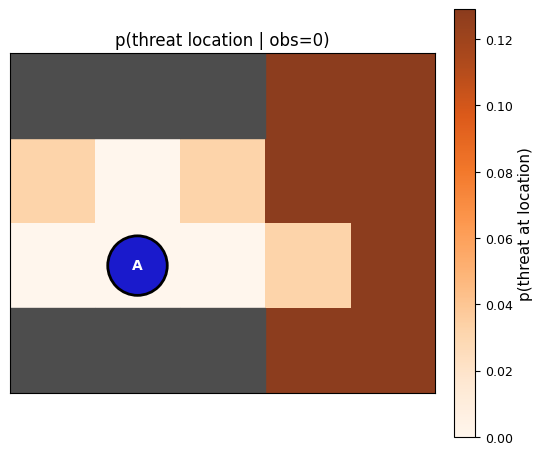

In [ ]:
# ---------- Likelihood map for a modality (example: threat intensity) ----------
def plot_likelihood_for_obs(modality=0, obs_value=3, true_agent_pos=None, true_shelter_indices=None,
                            A_obj=A, figsize=(6,6), cmap='Oranges'):
    """
    modality: 0 threat, 1 shelter, 2 agent-proprio
    obs_value: observed discrete value index (e.g., threat intensity level)
    true_agent_pos: if provided, will condition agent index in the likelihood, else marginalize over agent uniformly
    true_shelter_indices: if provided and modality != 2, will marginalize appropriately; if None, average over all shelter states
    A_obj: A object array as in notebook
    """
    if modality == 0:
        A_mod = A_obj[0]  # shape (n_threat_obs, n_agent, n_threat, n_shelter)
        n_outcomes = A_mod.shape[0]
        if obs_value < 0 or obs_value >= n_outcomes:
            raise ValueError("obs_value out of range")
        # build likelihood over threat states: P(obs | threat_state) marginalized over agent/shelter if needed
        likelihood = np.zeros(A_mod.shape[2], dtype=float)  # over threat states
        # choose agent marginalization
        if true_agent_pos is None:
            agent_idxs = range(A_mod.shape[1])
        else:
            agent_idxs = [int(true_agent_pos)]
        # choose shelter marginalization
        if true_shelter_indices is None:
            shelter_idxs = range(A_mod.shape[3])
        else:
            shelter_idxs = list(true_shelter_indices)
        # accumulate
        for a in agent_idxs:
            for s in shelter_idxs:
                likelihood += A_mod[obs_value, a, :, s]
        likelihood /= (len(agent_idxs) * max(1, len(shelter_idxs)))
        # normalize
        likelihood = likelihood / (likelihood.sum() + 1e-12)

        grid = heatvec_to_grid(likelihood, rows, cols, mask, state_idx_to_rc)
        fig, ax = plt.subplots(figsize=figsize) 
        plot_grid_base(ax)
        img = overlay_heatmap(ax, grid, cmap=cmap, alpha=0.9)
        draw_agent_threat_shelter(ax, agent_state=true_agent_pos, shelter_indices=None)
        plt.title(f"p(threat location | obs={obs_value})")
        plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04, label='p(threat at location)')
        plt.show()
    else:
        raise NotImplementedError("This helper currently implements threat-modality likelihood visualization only.")

# Example usage:
plot_likelihood_for_obs(modality=0, obs_value=0, true_agent_pos=3, true_shelter_indices=true_shelter_pos)


TypeError: int() argument must be a string, a bytes-like object or a real number, not 'NoneType'

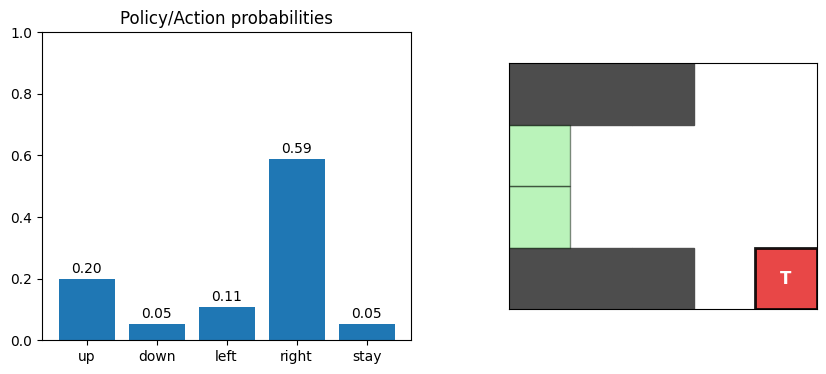

In [ ]:
# ---------- Policy + on-grid arrows ----------
def plot_policy_and_arrows(agent_obj, agent_state=None, policies_list=None, chosen_policy_idx=None, figsize=(10,4)):
    """
    Plots q_pi_agent as bar chart and overlays arrows scaled by probabilities on a grid inset.
    - policies_list: your 'policies' variable (if None, uses global)
    - chosen_policy_idx: optional int to highlight one chosen policy
    """
    if policies_list is None:
        policies_list = policies
    # get policy posterior
    q_pi = np.array(agent_obj.infer_policies()[0]) if hasattr(agent_obj, 'infer_policies') else None
    # Some Agent APIs expect infer_policies to be called earlier; try to get q_pi from last call if available
    try:
        q_pi = np.array(agent_obj.q_pi)  # if Agent stores last q_pi
    except Exception:
        pass
    # fallback: you might already have q_pi_agent variable outside; try that
    if q_pi is None:
        raise RuntimeError("Could not find policy posterior. Ensure agent_obj.infer_policies() was run or agent_obj.q_pi exists.")
    # collapse to action probs (since policy_len=1 and control factor 0 is agent)
    # build probs per atomic action (0..4)
    action_probs = np.zeros(len(actions), dtype=float)
    for pi_idx, pol in enumerate(policies_list):
        a = int(pol[0, 0])
        action_probs[a] += q_pi[pi_idx]

    # plot
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(1, 3, width_ratios=[1.2, 0.02, 1])
    axbar = fig.add_subplot(gs[0,0])
    axbar.bar(actions, action_probs)
    axbar.set_ylim(0, 1.0)
    axbar.set_title("Policy/Action probabilities")
    for i, v in enumerate(action_probs):
        axbar.text(i, v + 0.02, f"{v:.2f}", ha='center')

    # inset grid for arrows
    ax_grid = fig.add_subplot(gs[0,2])
    plot_grid_base(ax_grid)
    draw_agent_threat_shelter(ax_grid, agent_state=agent_state, threat_state=true_threat_pos, shelter_indices=true_shelter_pos)
    draw_policy_arrows(ax_grid, agent_state, action_probs, color='black')
    ax_grid.set_title("")
    plt.show()

# Example usage:
# Make sure agent_obj.infer_policies() has been called in your loop or call it now to obtain q_pi.
q_pi_agent, _ = agent_obj.infer_policies()
plot_policy_and_arrows(agent_obj)


DEBUG: q_pi (top 8): [0.218 0.115 0.299 0.253 0.115]
DEBUG: action_probs: {'up': 0.218, 'down': 0.115, 'left': 0.299, 'right': 0.253, 'stay': 0.115}
DEBUG: sample policy->action mapping (first 10): {0: 0, 1: 1, 2: 2, 3: 3, 4: 4}


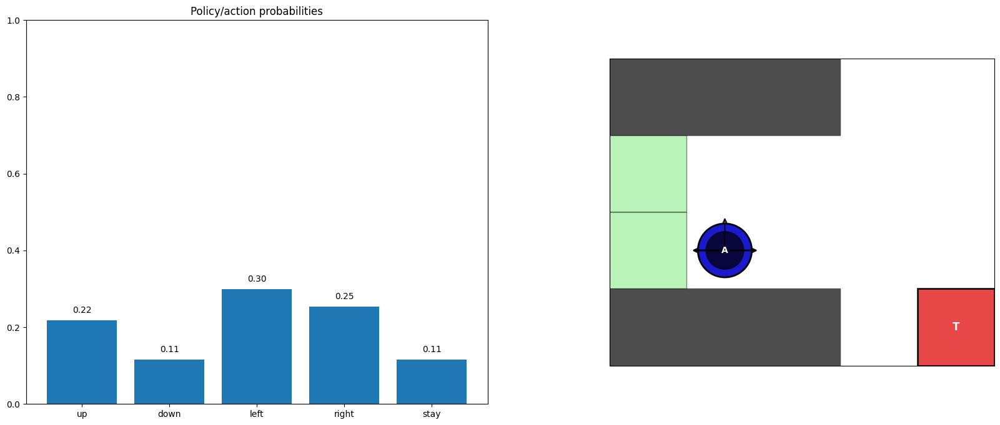

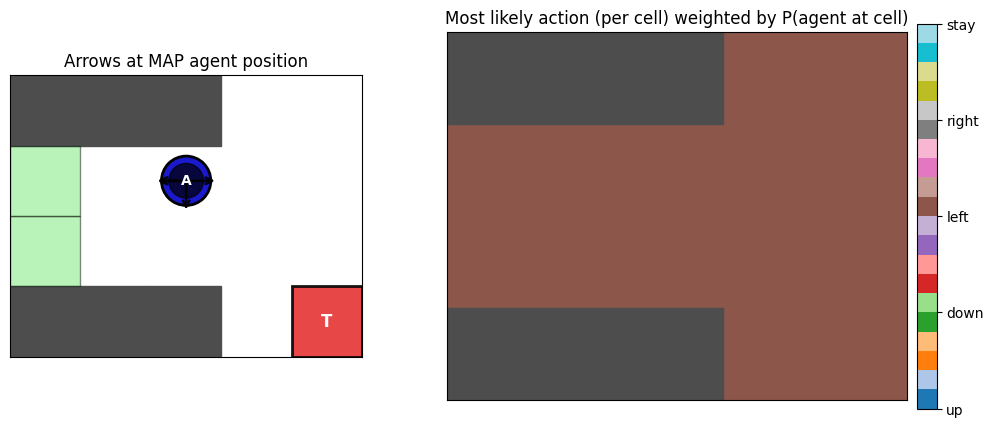

DEBUG: collapsed action_probs: {'up': 0.218, 'down': 0.115, 'left': 0.299, 'right': 0.253, 'stay': 0.115}


(array([0.21766928, 0.11489906, 0.29928942, 0.25324317, 0.11489906]),
 array([[4.20877722e-39, 5.65354349e-41, 8.74008250e-22, 1.62197570e-20,
         8.15636666e-35, 3.56376238e-39, 7.72371676e-40, 1.80469218e-36,
         2.54206080e-19, 2.17669281e-01, 1.86851565e-35, 3.76696113e-39,
         1.70734284e-36, 3.50070841e-37],
        [2.22164816e-39, 2.98428352e-41, 4.61354622e-22, 8.56177256e-21,
         4.30542556e-35, 1.88117017e-39, 4.07704667e-40, 9.52626111e-37,
         1.34185404e-19, 1.14899063e-01, 9.86316015e-36, 1.98843080e-39,
         9.01239216e-37, 1.84788645e-37],
        [5.78695581e-39, 7.77347069e-41, 1.20173791e-21, 2.23017309e-20,
         1.12147854e-34, 4.90007771e-39, 1.06199034e-39, 2.48140336e-36,
         3.49526543e-19, 2.99289425e-01, 2.56915892e-35, 5.17947054e-39,
         2.34755062e-36, 4.81338019e-37],
        [4.89662145e-39, 6.57750717e-41, 1.01684820e-21, 1.88705664e-20,
         9.48936898e-35, 4.14619126e-39, 8.98601072e-40, 2.09963464e-36,
 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec

# ---------- Fixed policy->arrow plotting (robust) ----------
def plot_policy_and_arrows_fixed(agent_obj, agent_state=None, policies_list=None, figsize=(20,8), do_debug=True):
    """
    Robust plotting:
      - Uses agent_obj.policies if available; else uses given policies_list or global 'policies'.
      - Calls infer_policies() if necessary to get a current q_pi.
      - Builds action_probs by summing q_pi over policies that choose each action.
      - Places arrows at agent_state (or at MAP agent posterior if agent_state None).
    """
    # 1. select policy list used by the agent (if agent stores it)
    if hasattr(agent_obj, 'policies') and agent_obj.policies is not None:
        pol_list = agent_obj.policies
    elif policies_list is not None:
        pol_list = policies_list
    else:
        pol_list = globals().get('policies', None)
    if pol_list is None:
        raise RuntimeError("No policies list found (agent_obj.policies or global 'policies').")

    # 2. get policy posterior q_pi
    q_pi = None
    # try infer_policies() return
    try:
        q_pi, _ = agent_obj.infer_policies()
    except Exception:
        pass
    # try stored attribute
    if q_pi is None:
        q_pi = getattr(agent_obj, 'q_pi', None)
    if q_pi is None:
        # fallback: try attribute name used in some codebases
        q_pi = getattr(agent_obj, 'q_pi_agent', None)
    if q_pi is None:
        raise RuntimeError("Could not obtain policy posterior q_pi. Run agent_obj.infer_policies() earlier or ensure agent stores q_pi.")

    q_pi = np.array(q_pi, dtype=float).ravel()
    if q_pi.sum() <= 0:
        raise RuntimeError("q_pi sums to zero.")
    q_pi = q_pi / q_pi.sum()

    # 3. build action_probs from policy list (handles policy_len=1 typical case)
    action_probs = np.zeros(len(actions), dtype=float)
    for pi_idx, pol in enumerate(pol_list):
        # robust extraction: pol might be numpy array shaped (policy_len, n_control_factors)
        try:
            a = int(pol[0, 0])
        except Exception:
            # try flatten
            pol_arr = np.array(pol)
            a = int(pol_arr.flatten()[0])
        if a < 0 or a >= len(actions):
            # skip invalid
            continue
        # ensure alignment: if q_pi length doesn't match policy list, warn/debug
        if pi_idx >= len(q_pi):
            # mismatch: break and raise error
            raise RuntimeError(f"q_pi length ({len(q_pi)}) and policy list length ({len(pol_list)}) mismatch.")
        action_probs[a] += float(q_pi[pi_idx])

    # normalization safety
    action_probs = action_probs / (action_probs.sum() + 1e-12)

    # debug print
    if do_debug:
        print("DEBUG: q_pi (top 8):", np.round(q_pi[:min(8,len(q_pi))],3))
        print("DEBUG: action_probs:", {actions[i]: float(np.round(action_probs[i],3)) for i in range(len(actions))})
        # show the mapping of some policies -> actions for inspection
        sample_map = {i: int(np.array(pol_list[i]).flatten()[0]) for i in range(min(10, len(pol_list)))}
        print("DEBUG: sample policy->action mapping (first 10):", sample_map)

    # 4. plotting: bar + arrow inset
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(1, 3, width_ratios=[1.2, 0.02, 1])
    axbar = fig.add_subplot(gs[0,0])
    axbar.bar(actions, action_probs, color='C0')
    axbar.set_ylim(0, 1.0)
    axbar.set_title("Policy/action probabilities")
    for i, v in enumerate(action_probs):
        axbar.text(i, v + 0.02, f"{v:.2f}", ha='center')

    # inset grid for arrows
    ax_grid = fig.add_subplot(gs[0,2])
    # reuse your grid base helper if present; else set basic axes
    try:
        plot_grid_base(ax_grid)
    except Exception:
        ax_grid.set_xlim(-0.5, cols - 0.5)
        ax_grid.set_ylim(rows - 0.5, -0.5)
        ax_grid.invert_yaxis()
        ax_grid.set_xticks([]); ax_grid.set_yticks([])

    # if agent_state not provided, use MAP of agent posterior (if available)
    if agent_state is None:
        try:
            q_agent = np.array(agent_obj.qs[0])
            agent_state = int(np.argmax(q_agent))
        except Exception:
            agent_state = None

    draw_agent_threat_shelter(ax_grid, agent_state=agent_state, threat_state=true_threat_pos, shelter_indices=true_shelter_pos)
    draw_policy_arrows(ax_grid, agent_state, action_probs, color='black')
    ax_grid.set_title("")
    plt.show()
    return action_probs


# ---------- Expected-action-per-cell visualization (marginalize over q_agent) ----------
def plot_policy_and_arrows_expected(agent_obj, policies_list=None, show_heatmap=True, figsize=(12,5)):
    """
    Computes expected action probability on each grid cell by marginalizing over agent posterior q_agent:
      P(action=a at cell x) = sum_pi q_pi(pi) * 1[action_of(pi) == a]
    then multiplies by P(agent at cell x) to get expected action mass at each cell.
    Plots:
      - left: for the given MAP agent position, arrows scaled by action_probs (like fixed func)
      - right: heatmaps for each action showing expected mass over cells (or combined most-probable action per cell)
    """
    # choose policy list
    if hasattr(agent_obj, 'policies') and agent_obj.policies is not None:
        pol_list = agent_obj.policies
    elif policies_list is not None:
        pol_list = policies_list
    else:
        pol_list = globals().get('policies', None)
    if pol_list is None:
        raise RuntimeError("No policies found.")

    # get q_pi
    q_pi = None
    try:
        q_pi, _ = agent_obj.infer_policies()
    except Exception:
        q_pi = getattr(agent_obj, 'q_pi', None)
    if q_pi is None:
        raise RuntimeError("Could not obtain q_pi.")
    q_pi = np.array(q_pi).ravel()
    q_pi = q_pi / (q_pi.sum() + 1e-12)

    # map policy->action
    n_actions = len(actions)
    pi_action = np.zeros(len(pol_list), dtype=int)
    for i, pol in enumerate(pol_list):
        try:
            a = int(pol[0, 0])
        except Exception:
            a = int(np.array(pol).flatten()[0])
        pi_action[i] = a

    # compute action_probs (policy collapse)
    action_probs = np.zeros(n_actions, dtype=float)
    for i, a in enumerate(pi_action):
        if i < len(q_pi):
            action_probs[a] += q_pi[i]
    action_probs /= (action_probs.sum() + 1e-12)

    # get agent posterior q_agent (over compact states)
    q_agent = np.array(agent_obj.qs[0], dtype=float)
    q_agent /= (q_agent.sum() + 1e-12)

    # Expected action mass at cell x: P(agent at x) * P(action=a | beliefs)
    # Note: P(action|beliefs) is global (action_probs) under policy_len=1; to be more exact you'd compute per-state expected action by recomputing q_pi conditioned on that state's sensation
    # Here we show expected mass = q_agent[x] * action_probs[a]
    n_states = len(q_agent)
    action_cell_mass = np.zeros((n_actions, n_states), dtype=float)
    for a in range(n_actions):
        action_cell_mass[a, :] = action_probs[a] * q_agent

    # plotting
    fig, axs = plt.subplots(1, 2, figsize=figsize, gridspec_kw={'width_ratios':[1,1.4]})
    # left: arrow plot at MAP cell
    axl = axs[0]
    try:
        plot_grid_base(axl)
    except Exception:
        axl.set_xlim(-0.5, cols - 0.5); axl.set_ylim(rows - 0.5, -0.5); axl.invert_yaxis(); axl.set_xticks([]); axl.set_yticks([])
    map_idx = int(np.argmax(q_agent))
    draw_agent_threat_shelter(axl, agent_state=map_idx, threat_state=true_threat_pos, shelter_indices=true_shelter_pos)
    draw_policy_arrows(axl, map_idx, action_probs, color='black')
    axl.set_title("Arrows at MAP agent position")

    # right: action heatmaps (one row per action) or combined:
    axr = axs[1]
    # build combined "most likely action per cell" map for visualization
    most_action = np.argmax(action_cell_mass, axis=0)  # per cell index
    # convert to grid of action indices (NaN for blocked)
    grid_action = np.full((rows, cols), np.nan)
    for idx in range(n_states):
        r,c = state_idx_to_rc(int(idx))
        grid_action[r, c] = float(most_action[idx])
    im = axr.imshow(grid_action, cmap='tab20', origin='upper', vmin=0, vmax=max(4, np.nanmax(grid_action)))
    plot_grid_base(axr)
    axr.set_title("Most likely action (per cell) weighted by P(agent at cell)")
    cbar = plt.colorbar(im, ax=axr, ticks=range(n_actions), fraction=0.046, pad=0.02)
    cbar.ax.set_yticklabels(actions)
    plt.show()

    # debug print
    print("DEBUG: collapsed action_probs:", {actions[i]: float(np.round(action_probs[i],3)) for i in range(n_actions)})
    return action_probs, action_cell_mass

# ---------------- Example usage ----------------
# Ensure agent_obj.infer_states(obs) and agent_obj.infer_policies() have been run before calling fixed plot,
# or the functions will call infer_policies() internally.
# Example:
# qs = agent_obj.infer_states(last_obs)
# q_pi_agent, _ = agent_obj.infer_policies()
plot_policy_and_arrows_fixed(agent_obj, agent_state=3)
plot_policy_and_arrows_expected(agent_obj)


/tmp/ipykernel_54817/1948310523.py:84: RuntimeWarning: divide by zero encountered in log
  ent = -np.sum(np.where(p_o_ag > 0, p_o_ag * np.log(p_o_ag), 0.0))
/tmp/ipykernel_54817/1948310523.py:84: RuntimeWarning: invalid value encountered in multiply
  ent = -np.sum(np.where(p_o_ag > 0, p_o_ag * np.log(p_o_ag), 0.0))


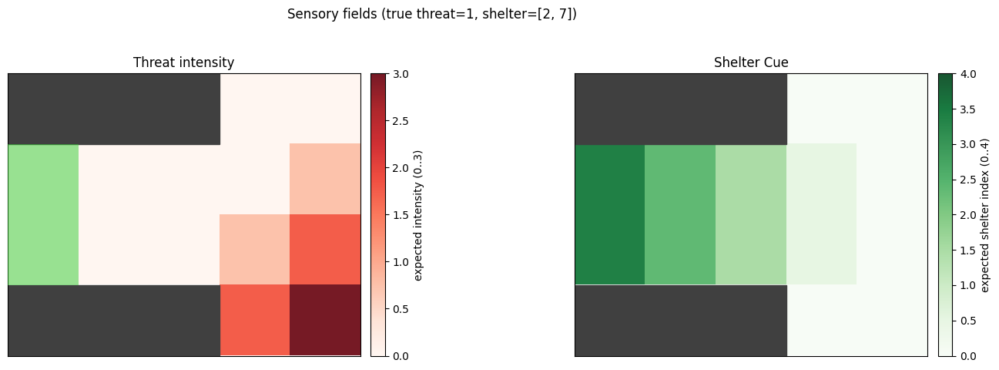

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# ---------- helpers (re-uses your state_idx_to_rc, mask) ----------
def heatvec_to_grid(vec, rows, cols, mask, state_idx_to_rc):
    grid = np.full((rows, cols), np.nan, dtype=float)
    for idx, v in enumerate(vec):
        r,c = state_idx_to_rc(int(idx))
        grid[r, c] = float(v)
    # keep blocked cells NaN
    grid = np.where(mask, grid, np.nan)
    return grid

def plot_grid_background(ax, rows, cols, mask, cell_edgecolor='k'):
    ax.set_xlim(-0.5, cols - 0.5)
    ax.set_ylim(rows - 0.5, -0.5)
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
    # blocked cells
    for r in range(rows):
        for c in range(cols):
            if not mask[r, c]:
                ax.add_patch(Rectangle((c-0.5, r-0.5), 1, 1, color=(0.25,0.25,0.25)))

# ---------- compute sensory fields ----------

# We will compute expectation of observation value for each agent cell, given the true threat & shelter.
# For threat modality (A[0]): shape (n_threat_obs, n_agent, n_threat, n_shelter)
# For shelter modality (A[1]): shape (n_shelter_obs, n_agent, n_threat, n_shelter)
# For agent proprio (A[2]): shape (n_agent_obs, n_agent, n_threat, n_shelter)

A_threat = A[0]
A_shelter = A[1]
A_agent = A[2]

n_threat_obs = A_threat.shape[0]
n_shelter_obs = A_shelter.shape[0]
n_agent_obs = A_agent.shape[0]

# Normalize true_shelter_pos into a list (could be multi-cell)
if isinstance(true_shelter_pos, (list, tuple, np.ndarray, set)):
    shelter_indices = list(map(int, sorted(list(true_shelter_pos))))
else:
    shelter_indices = [int(true_shelter_pos)]

# Pre-allocate vectors over agent-space
n_states = len(state_to_rc)
expected_threat = np.zeros(n_states, dtype=float)
expected_shelter = np.zeros(n_states, dtype=float)
proprio_entropy = np.zeros(n_states, dtype=float)

# For each candidate agent cell a, compute P(o | a, true_threat, shelter) and take expectation
for a in range(n_states):
    # threat modality: average over possibly multi-cell shelter indices
    p_o_th = np.zeros(n_threat_obs, dtype=float)
    for s_idx in shelter_indices:
        p_o_th += A_threat[:, a, int(true_threat_pos), s_idx]
    p_o_th /= len(shelter_indices)
    p_o_th /= (p_o_th.sum() + 1e-12)   # safety normalize
    # expected intensity (we use indices 0..(n_threat_obs-1) as ordinal intensity)
    obs_vals_th = np.arange(n_threat_obs, dtype=float)
    expected_threat[a] = float(np.dot(p_o_th, obs_vals_th))

    # shelter modality
    p_o_sh = np.zeros(n_shelter_obs, dtype=float)
    for s_idx in shelter_indices:
        p_o_sh += A_shelter[:, a, int(true_threat_pos), s_idx]
    p_o_sh /= len(shelter_indices)
    p_o_sh /= (p_o_sh.sum() + 1e-12)
    obs_vals_sh = np.arange(n_shelter_obs, dtype=float)
    expected_shelter[a] = float(np.dot(p_o_sh, obs_vals_sh))

    # proprioception modality: entropy of emission P(o_agent | a, threat, shelter)
    # (if A_agent is one-hot, entropy ≈ 0 for all a)
    p_o_ag = np.zeros(n_agent_obs, dtype=float)
    for s_idx in shelter_indices:
        p_o_ag += A_agent[:, a, int(true_threat_pos), s_idx]
    p_o_ag /= len(shelter_indices)
    p_o_ag /= (p_o_ag.sum() + 1e-12)
    # entropy:
    ent = -np.sum(np.where(p_o_ag > 0, p_o_ag * np.log(p_o_ag), 0.0))
    proprio_entropy[a] = float(ent)

# Map to grids
grid_threat = heatvec_to_grid(expected_threat, rows, cols, mask, state_idx_to_rc)
grid_shelter = heatvec_to_grid(expected_shelter, rows, cols, mask, state_idx_to_rc)
grid_proprio_ent = heatvec_to_grid(proprio_entropy, rows, cols, mask, state_idx_to_rc)

# ---------- plotting ----------
fig, axs = plt.subplots(1, 2, figsize=(15,5))
cmap_th = plt.get_cmap('Reds')
cmap_sh = plt.get_cmap('Greens')
cmap_pr = plt.get_cmap('viridis')

# assume: shelter_indices, state_idx_to_rc, rows, cols, mask, fig, axs, grid_threat, cmap_th, n_threat_obs exist

ax = axs[0]
plot_grid_background(ax, rows, cols, mask)

# Show the grid heatmap
im0 = ax.imshow(grid_threat, cmap=cmap_th, alpha=0.9, origin='upper',
                vmin=0, vmax=(n_threat_obs-1))
ax.set_title('Threat intensity')
cbar0 = fig.colorbar(im0, ax=ax, fraction=0.046, pad=0.02)
cbar0.set_label(f'expected intensity (0..{n_threat_obs-1})')

# --- Highlight shelter cells in green (no borders) ---
for s in shelter_indices:
    if isinstance(s, (list, tuple)) and len(s) == 2:
        r, c = s
    else:
        r, c = state_idx_to_rc(int(s))

    # Fill shelter cells seamlessly in green (no border)
    ax.add_patch(Rectangle(
        (c - 0.5, r - 0.5), 1, 1,
        linewidth=0,               # no border
        facecolor='limegreen',     # fill color
        edgecolor=None,
        alpha=0.5,                 # translucency (adjust 0–1)
        zorder=5
    ))



# Shelter observation expected (green)
ax = axs[1]
plot_grid_background(ax, rows, cols, mask)
im1 = ax.imshow(grid_shelter, cmap=cmap_sh, alpha=0.9, origin='upper', vmin=0, vmax=(n_shelter_obs-1))
ax.set_title('Shelter Cue')
cbar1 = fig.colorbar(im1, ax=ax, fraction=0.046, pad=0.02)
cbar1.set_label('expected shelter index (0..{})'.format(n_shelter_obs-1))

# # Proprioception entropy (how precise is self-location sensing)
# ax = axs[2]
# plot_grid_background(ax, rows, cols, mask)
# # use lower vmax for better contrast if entropy near 0
# vmax_pr = max(1e-6, np.nanmax(grid_proprio_ent))
# im2 = ax.imshow(grid_proprio_ent, cmap=cmap_pr, alpha=0.95, origin='upper', vmin=0, vmax=vmax_pr)
# ax.set_title('Proprioceptive entropy\n(lower = more precise self-sense)')
# cbar2 = fig.colorbar(im2, ax=ax, fraction=0.046, pad=0.02)
# cbar2.set_label('entropy (nats)')

plt.suptitle("Sensory fields (true threat={}, shelter={})".format(true_threat_pos, shelter_indices))
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


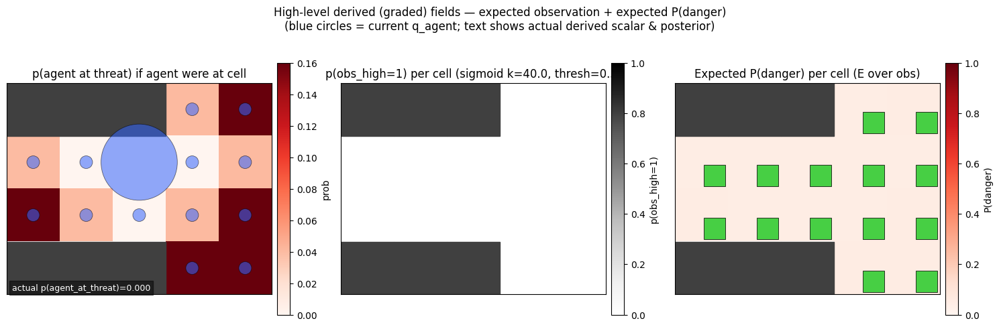

P(danger) if obs=0: 0.050, if obs=1: 0.950
Actual derived scalar dot(q_agent,q_threat) = 0.0000, actual obs_high = 0, actual P(danger) = 0.050


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from matplotlib import cm, colors

# --- parameters for graded detector ---
sigmoid_k = 40.0    # steepness (large -> near hard threshold)
sigmoid_offset = danger_detection_threshold  # center of sigmoid
sigma = 1.0 / sigmoid_k

# helpers
def vec_to_grid(vec):
    grid = np.full((rows, cols), np.nan, dtype=float)
    for idx, v in enumerate(vec):
        r,c = state_idx_to_rc(int(idx))
        grid[r,c] = float(v)
    grid = np.where(mask, grid, np.nan)
    return grid

def draw_grid_base(ax):
    ax.set_xlim(-0.5, cols - 0.5)
    ax.set_ylim(rows - 0.5, -0.5)
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.set_xticks([]); ax.set_yticks([])
    for r in range(rows):
        for c in range(cols):
            if not mask[r, c]:
                ax.add_patch(Rectangle((c-0.5, r-0.5), 1, 1, color=(0.25,0.25,0.25)))

# --- get current low-level threat posterior ---
q_threat = np.array(agent_obj.qs[1]).ravel()   # P(threat at each compact cell)
q_agent = np.array(agent_obj.qs[0]).ravel()    # P(agent at cell) — for overlay/weighting

n_states = len(q_threat)

# per-cell hypothetical: p(agent_at_threat) if agent were at that cell = q_threat[cell]
p_agent_at_threat_vec = q_threat.copy()   # that's the intended mapping

# graded detector: p(obs_high=1 | p_agent_at_threat) = sigmoid((p - offset)*k)
def sigmoid(x):
    return 1.0 / (1.0 + np.exp(-x))

k = sigmoid_k
p_obs1_vec = sigmoid(k * (p_agent_at_threat_vec - sigmoid_offset))  # values in (0,1)

# high-level A and D
A_high = A_high_obj[0] if isinstance(A_high_obj, (list, np.ndarray)) else A_high_obj
D_high = D_high_obj[0] if isinstance(D_high_obj, (list, np.ndarray)) else D_high_obj

# compute the posterior P(danger | obs=0/1) via Bayes
def posterior_high_given_obs(obs_idx):
    lik = np.asarray(A_high[obs_idx, :]).ravel()
    unnorm = lik * np.asarray(D_high).ravel()
    post = unnorm / (unnorm.sum() + 1e-12)
    return post

post_if_obs0 = posterior_high_given_obs(0)
post_if_obs1 = posterior_high_given_obs(1)
p_danger_if_obs0 = float(post_if_obs0[1])
p_danger_if_obs1 = float(post_if_obs1[1])

# expected P(danger) per cell (marginalizing the stochastic obs_high)
p_danger_expected_vec = p_obs1_vec * p_danger_if_obs1 + (1.0 - p_obs1_vec) * p_danger_if_obs0

# Also compute the true derived scalar used in your main loop:
p_agent_at_threat_actual = float(np.dot(q_agent, q_threat))   # single scalar
obs_high_actual = 1 if (p_agent_at_threat_actual > danger_detection_threshold) else 0
p_danger_actual = (p_danger_if_obs1 if obs_high_actual==1 else p_danger_if_obs0)

# map to grids
grid_p_agent_at_threat = vec_to_grid(p_agent_at_threat_vec)
grid_p_obs1 = vec_to_grid(p_obs1_vec)
grid_p_danger_expected = vec_to_grid(p_danger_expected_vec)
grid_q_agent = vec_to_grid(q_agent)

# --- plotting ---
fig, axs = plt.subplots(1, 3, figsize=(15,5))
cmap_th = cm.Reds
cmap_det = cm.Greys
cmap_pd = cm.Reds

# left: p(agent at threat)
ax = axs[0]; draw_grid_base(ax)
im0 = ax.imshow(grid_p_agent_at_threat, cmap=cmap_th, origin='upper', vmin=0, vmax=np.nanmax(grid_p_agent_at_threat))
ax.set_title('p(agent at threat) if agent were at cell')
cbar0 = fig.colorbar(im0, ax=ax, fraction=0.046, pad=0.02); cbar0.set_label('prob')

# overlay actual agent posterior as blue circles (size ~ prob)
for idx, prob in enumerate(q_agent):
    if prob <= 0: continue
    r,c = state_idx_to_rc(int(idx))
    ax.add_patch(Circle((c, r), 0.12 + 0.6 * prob, color=(0.2,0.4,1.0), alpha=0.55, linewidth=0.6, ec='k'))
ax.text(0.02, 0.02, f"actual p(agent_at_threat)={p_agent_at_threat_actual:.3f}", transform=ax.transAxes,
        color='white', fontsize=9, bbox=dict(facecolor='black', alpha=0.5, pad=3))

# middle: graded detector p(obs_high=1)
ax = axs[1]; draw_grid_base(ax)
im1 = ax.imshow(grid_p_obs1, cmap=cmap_det, origin='upper', vmin=0, vmax=1)
ax.set_title(f'p(obs_high=1) per cell (sigmoid k={k}, thresh={sigmoid_offset})')
cbar1 = fig.colorbar(im1, ax=ax, fraction=0.046, pad=0.02); cbar1.set_label('p(obs_high=1)')

# right: expected P(danger) per cell (marginalizing obs)
ax = axs[2]; draw_grid_base(ax)
im2 = ax.imshow(grid_p_danger_expected, cmap=cmap_pd, origin='upper', vmin=0, vmax=1)
ax.set_title('Expected P(danger) per cell (E over obs)')
cbar2 = fig.colorbar(im2, ax=ax, fraction=0.046, pad=0.02); cbar2.set_label('P(danger)')

# overlay small control squares (green safe if expected P < 0.5 else red)
for idx in range(n_states):
    r,c = state_idx_to_rc(int(idx))
    pd = p_danger_expected_vec[idx]
    color = (0.2,0.8,0.2) if pd < 0.5 else (0.9,0.2,0.2)
    axs[2].add_patch(Rectangle((c+0.05, r-0.45), 0.4, 0.4, color=color, alpha=0.9, ec='k', linewidth=0.6))

plt.suptitle("High-level derived (graded) fields — expected observation + expected P(danger)\n(blue circles = current q_agent; text shows actual derived scalar & posterior)")
plt.tight_layout(rect=[0,0.03,1,0.95])
plt.show()

print(f"P(danger) if obs=0: {p_danger_if_obs0:.3f}, if obs=1: {p_danger_if_obs1:.3f}")
print(f"Actual derived scalar dot(q_agent,q_threat) = {p_agent_at_threat_actual:.4f}, actual obs_high = {obs_high_actual}, actual P(danger) = {p_danger_actual:.3f}")


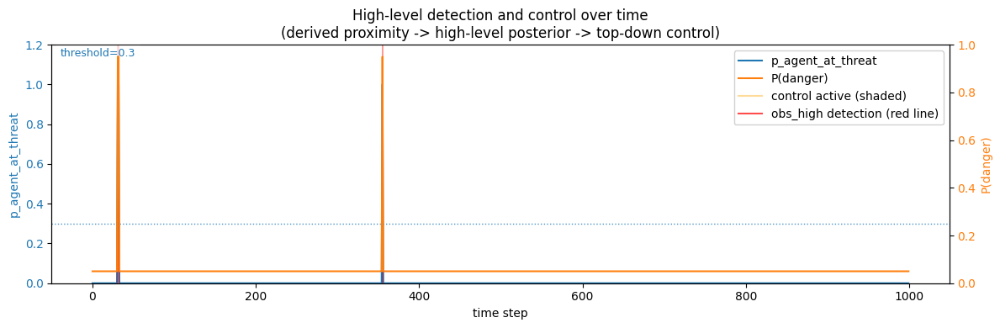

Total steps: 1000; detections (obs_high==1): 3; control_on steps (P(danger)>0.5): 3
First few detection indices: [31, 32, 355]
First few control-on runs start indices (approx): [31, 355]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ----------------- parameters & safety checks -----------------
# expected names in your notebook (adjust if necessary)
hist_name = 'history'
thresh = danger_detection_threshold  # from your notebook
A_high_arr = A_high_obj[0] if isinstance(A_high_obj, (list, np.ndarray)) else A_high_obj
D_high_arr = D_high_obj[0] if isinstance(D_high_obj, (list, np.ndarray)) else D_high_obj

if hist_name not in globals():
    raise RuntimeError("Couldn't find 'history' in the notebook namespace. This plot expects history['beliefs'] to exist.")

history_beliefs = history.get('beliefs', None)
if history_beliefs is None:
    raise RuntimeError("history exists but has no 'beliefs' key. The plot needs history['beliefs'] saved during the run.")

T = len(history_beliefs)
if T == 0:
    raise RuntimeError("history['beliefs'] is empty.")

# ----------------- helper: compute P(danger) from obs (Bayes) -----------------
def posterior_high_given_obs(obs_idx, A_high_arr=A_high_arr, D_high_arr=D_high_arr):
    # A_high_arr shape (n_obs_high, n_danger)
    lik = np.asarray(A_high_arr[obs_idx, :]).ravel()
    prior = np.asarray(D_high_arr).ravel()
    unnorm = lik * prior
    post = unnorm / (unnorm.sum() + 1e-12)
    return post  # vector length n_danger

post_if_obs0 = posterior_high_given_obs(0)
post_if_obs1 = posterior_high_given_obs(1)
p_danger_if_obs0 = float(post_if_obs0[1])
p_danger_if_obs1 = float(post_if_obs1[1])

# ----------------- extract per-step derived scalars from history -----------------
p_agent_at_threat = np.zeros(T, dtype=float)
p_danger = np.zeros(T, dtype=float)
obs_high = np.zeros(T, dtype=int)

for t in range(T):
    qs = history_beliefs[t]
    # expect qs to be [q_agent, q_threat, q_shelter] or similar
    try:
        q_agent = np.asarray(qs[0]).ravel()
        q_threat = np.asarray(qs[1]).ravel()
    except Exception:
        # fallback: if structure unknown, try to handle plausible shapes
        arr = np.asarray(qs)
        if arr.ndim >= 2:
            q_agent = arr[0].ravel()
            q_threat = arr[1].ravel()
        else:
            raise RuntimeError(f"Unexpected history['beliefs'][{t}] format: {type(qs)}")
    # derived scalar
    p_at = float(np.dot(q_agent, q_threat))
    p_agent_at_threat[t] = p_at
    # threshold -> obs_high (this matches your main-loop thresholding)
    obs = 1 if (p_at > thresh) else 0
    obs_high[t] = obs
    # high-level posterior (Bayes on that binary obs)
    p_danger[t] = p_danger_if_obs1 if obs == 1 else p_danger_if_obs0

# ----------------- detect high-level "control on" events -----------------
# Decision rule used in your model: choose control=1 when P(danger) > 0.5 (approx)
control_on = (p_danger > 0.5).astype(int)

# find change points when control toggles on
on_indices = np.where(control_on == 1)[0]
obs_indices = np.where(obs_high == 1)[0]

# ----------------- plotting -----------------
fig, ax1 = plt.subplots(figsize=(12,4))

# p_agent_at_threat (primary axis)
ax1.plot(np.arange(T), p_agent_at_threat, label='p_agent_at_threat (dot(q_agent,q_threat))', color='C0')
ax1.set_ylabel('p_agent_at_threat', color='C0')
ax1.set_ylim(0, max(0.2, p_agent_at_threat.max()*1.2))
ax1.tick_params(axis='y', labelcolor='C0')

# draw threshold line
ax1.axhline(thresh, color='C0', linestyle=':', linewidth=1.0, alpha=0.8)
ax1.text(0.01, 0.95, f"threshold={thresh}", transform=ax1.transAxes, color='C0', fontsize=9,
         bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

# p_danger on secondary axis
ax2 = ax1.twinx()
ax2.plot(np.arange(T), p_danger, label='P(danger) (high-level posterior)', color='C1')
ax2.set_ylabel('P(danger)', color='C1')
ax2.set_ylim(0, 1.0)
ax2.tick_params(axis='y', labelcolor='C1')

# highlight control-on intervals (shaded)
if on_indices.size > 0:
    # find continuous runs of control_on == 1 to shade them
    runs = []
    start = None
    for i in range(T):
        if control_on[i] == 1 and start is None:
            start = i
        elif control_on[i] == 0 and start is not None:
            runs.append((start, i-1))
            start = None
    if start is not None:
        runs.append((start, T-1))
    for (s,e) in runs:
        ax1.axvspan(s-0.5, e+0.5, color='orange', alpha=0.12, lw=0)

# vertical ticks for immediate detections (obs_high==1)
for idx in obs_indices:
    ax1.axvline(idx, color='red', linestyle='-', alpha=0.45, linewidth=1.2)

# small legend
lines = [plt.Line2D([0],[0],color='C0'), plt.Line2D([0],[0],color='C1'),
         plt.Line2D([0],[0],color='orange', alpha=0.4), plt.Line2D([0],[0],color='red', alpha=0.7)]
labels = ['p_agent_at_threat', 'P(danger)', 'control active (shaded)', 'obs_high detection (red line)']
ax1.legend(lines, labels, loc='upper right', framealpha=0.9)

ax1.set_xlabel('time step')
ax1.set_title('High-level detection and control over time\n(derived proximity -> high-level posterior -> top-down control)')

plt.tight_layout()
plt.show()

# ----------------- small printed summary -----------------
total_controls = int(control_on.sum())
total_detections = int(obs_high.sum())
print(f"Total steps: {T}; detections (obs_high==1): {total_detections}; control_on steps (P(danger)>0.5): {total_controls}")
# show a few sample indices
if total_detections > 0:
    print("First few detection indices:", obs_indices[:10].tolist())
if total_controls > 0:
    print("First few control-on runs start indices (approx):", [r[0] for r in runs][:10])
